 # 1. 简介数据

 乳腺癌是全世界女性最常见的死亡原因之一。早期发现有助于减少早期死亡人数。乳腺癌的早期发现通常通过乳房超声检查进行。然而，由于乳腺癌的形态学多样性，超声检查可能会具有挑战性。因此，开发能够准确识别乳腺癌超声图像的人工智能系统至关重要。



 本次使用的数据集包括 25 至 75 岁女性的乳房超声图像。该数据收集于2018年，患者人数为600名女性患者。该数据集由 780 张图像组成，平均图像大小为 500*500 像素。图像为 PNG 格式。有效正确的图像（ground truth）与原始图像一起呈现。图像将乳腺癌分为三类：正常、良性肿瘤和恶性肿瘤。乳腺超声图像与机器学习相结合，可以在乳腺癌的分类、检测和分割方面产生很好的效果。

In [43]:
# %%
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import copy
import os
import matplotlib.pyplot as plt
from PIL import Image  
import shutil
from glob import glob

import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, random_split
import random
from sklearn.model_selection import train_test_split

import torch.optim as optim
from torch.optim import lr_scheduler
from sklearn.metrics import classification_report, confusion_matrix

import seaborn as sns
from torchvision.transforms import RandomHorizontalFlip, RandomRotation, ColorJitter

import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms


 # Task 1: Classification

 ## 1）导入并清洗数据(3分) 

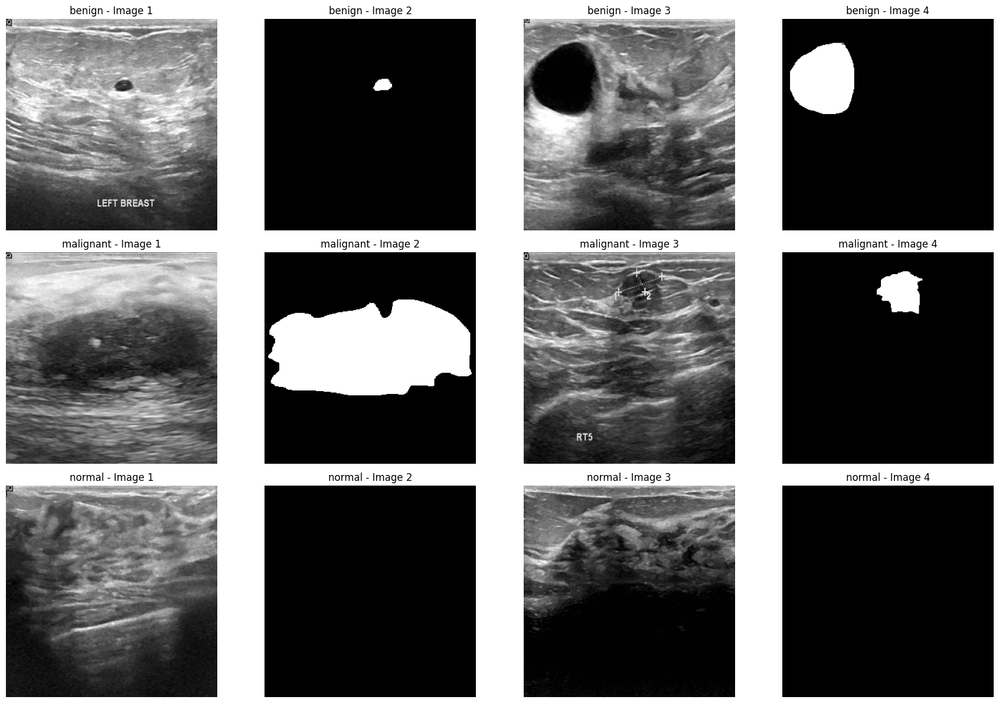

In [ ]:
# %%
import os
from PIL import Image
import matplotlib.pyplot as plt

# define the labels and data directory
labels = ['benign', 'malignant', 'normal']
data_dir = r'./Dataset_BUSI_with_GT'  

# define image size
fig, axs = plt.subplots(3, 4, figsize=(18, 12))

desired_width = 300  # set desired width
desired_height = 300  # set desired height

for i, label in enumerate(labels):
    label_dir = os.path.join(data_dir, label)
    
    # Get a list of image files
    image_files = [file for file in os.listdir(label_dir) if file.endswith('.png')]
    
    # Sort the list of image files
    image_files = sorted(image_files)
    
    # Loop through the first 4 image files
    for j in range(4):
        if j < len(image_files):
            # Load and resize the image
            image_path = os.path.join(label_dir, image_files[j])
            image = Image.open(image_path)
            # resize the image using LANCZOS resampling
            image = image.resize((desired_width, desired_height), Image.Resampling.LANCZOS)
            
            # Determine the label for the image
            image_label = f'{label} - Image {j + 1}'
            
            # Display the image with the corresponding label
            axs[i, j].imshow(image)
            axs[i, j].set_title(image_label)
            axs[i, j].axis('off')

plt.tight_layout()
plt.show()



In [45]:
# %%
working_dir = r"./working"

# Delete all files and subdirectories in the working directory
for item in os.listdir(working_dir):
    item_path = os.path.join(working_dir, item)
    if os.path.isfile(item_path):
        os.remove(item_path)
    elif os.path.isdir(item_path):
        shutil.rmtree(item_path)




In [46]:
# %%
import warnings

# Suppress DeprecationWarning and ResourceWarning
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=ResourceWarning)

# Set the path to the input folder containing images and masks
input_dir = r"./Dataset_BUSI_with_GT" 
# Set the path to the output folder where overlayed images will be saved
output_dir = r"./working/OverlayedImages"

# Create subdirectories for each label
labels = ['benign', 'malignant', 'normal']
for label in labels:
    os.makedirs(os.path.join(output_dir, label), exist_ok=True)

# Function to overlay images and masks, resize if needed, and save the result
def overlay_and_save(image_path, mask_path, output_path):
    try:
        # Check if both image and mask files exist
        if os.path.exists(image_path) and os.path.exists(mask_path):
            # Open the actual image and mask image
            image = Image.open(image_path)
            mask = Image.open(mask_path)

            # Ensure both images have the same color mode
            if image.mode != mask.mode:
                mask = mask.convert(image.mode)

            # Resize the images if their sizes don't match
            if image.size != mask.size:
                image = image.resize(mask.size)

            # Overlay the image with the mask
            overlayed = Image.blend(image, mask, alpha=0.5)

            # Save the overlayed image to the appropriate label folder
            label = os.path.basename(os.path.dirname(image_path))
            output_path = os.path.join(output_dir, label, os.path.basename(image_path))
            overlayed.save(output_path)
        else:
            #print(f"File not found for: {image_path} or {mask_path}. Skipping...")
            pass
    except Exception as e:
        print(f"An error occurred for: {image_path} or {mask_path}. Error: {str(e)}")

# Iterate through the subdirectories (benign, malignant, normal)
for label in labels:
    label_dir = os.path.join(input_dir, label)
    if os.path.isdir(label_dir):
        for image_filename in os.listdir(label_dir):
            if image_filename.endswith('.png'):
                image_path = os.path.join(label_dir, image_filename)
                # Construct the mask file path based on the naming convention
                mask_filename = image_filename.replace('.png', '_mask.png')
                mask_path = os.path.join(label_dir, mask_filename)
                overlay_and_save(image_path, mask_path, output_dir)



In [47]:
# %%
import os

# Function to count the number of files in a directory
def count_files_in_directory(directory):
    return sum(len(files) for _, _, files in os.walk(directory))

# Set the paths to the input and output directories
input_dir = r"./Dataset_BUSI_with_GT" 
output_dir = r"./working/OverlayedImages"

# Count the files in the input and output directories
input_counts = {}
output_counts = {}

# Count files in input directory
for label in os.listdir(input_dir):
    label_dir = os.path.join(input_dir, label)
    if os.path.isdir(label_dir):
        input_counts[label] = count_files_in_directory(label_dir)

# Count files in output directory
for label in os.listdir(output_dir):
    label_dir = os.path.join(output_dir, label)
    if os.path.isdir(label_dir):
        output_counts[label] = count_files_in_directory(label_dir)

# Print file counts
print("File Counts Before Overlay-includes masks:")
for label, count in input_counts.items():
    print(f"{label}: {count} files")

print("\nFile Counts After Overlay:")
for label, count in output_counts.items():
    print(f"{label}: {count} files")


File Counts Before Overlay-includes masks:
benign: 891 files
malignant: 421 files
normal: 266 files

File Counts After Overlay:
benign: 437 files
malignant: 210 files
normal: 133 files


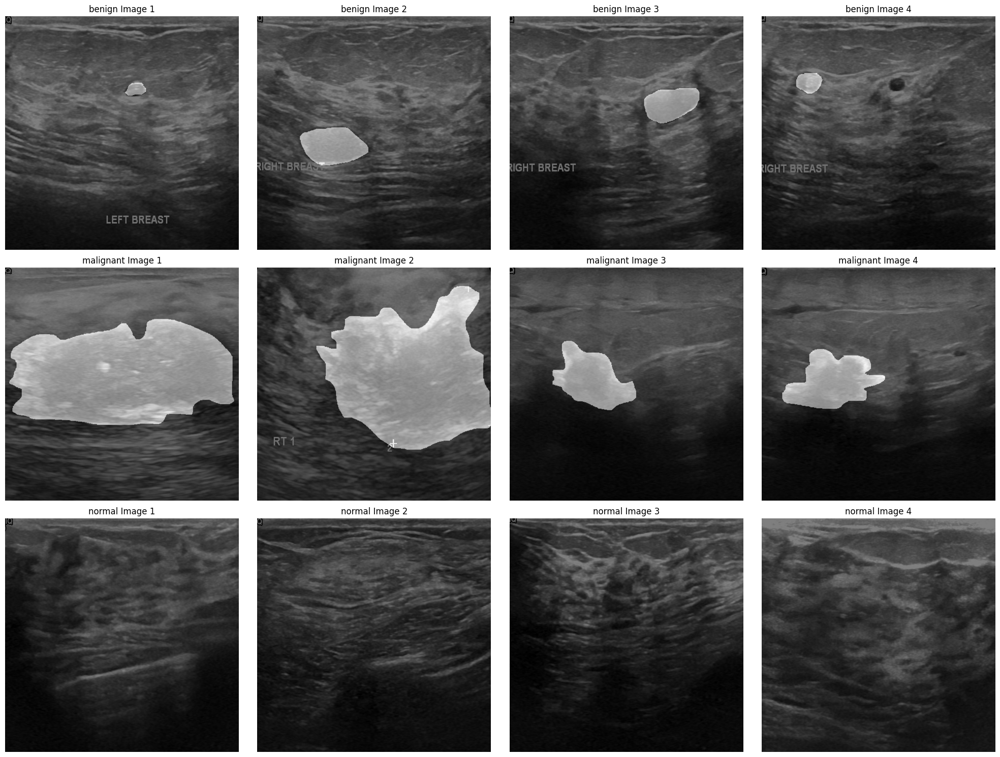

In [48]:
# %%
import os
from PIL import Image
import matplotlib.pyplot as plt

# Set the path to the overlayed images directory
overlayed_dir = r"./working/OverlayedImages"

# Create subdirectories for each label
labels = ['benign', 'malignant', 'normal']
label_dirs = [os.path.join(overlayed_dir, label) for label in labels]

# Create a figure to display the images
fig, axs = plt.subplots(3, 4, figsize=(20, 15))

# Desired width and height for each image
desired_width = 800  # Adjust as needed
desired_height = 800  # Adjust as needed

# Loop through each label and display the first 4 images
for i, label_dir in enumerate(label_dirs):
    # Get a list of image files and sort them
    images = [image for image in os.listdir(label_dir) if image.endswith('.png')]
    
    # Sort the images by number in parentheses (with error handling for robust sorting)
    def extract_number(filename):
        try:
            return int(filename.split('(')[1].split(')')[0])
        except (IndexError, ValueError):
            return float('inf')  # Files without numbers are sorted last
    
    images.sort(key=extract_number)

    for j, image_filename in enumerate(images[:4]):  # Display the first 4 images
        image_path = os.path.join(label_dir, image_filename)
        image = Image.open(image_path)

        # Resize the image to the desired width and height
        image = image.resize((desired_width, desired_height), Image.Resampling.LANCZOS)

        # Display the image in the subplot
        axs[i, j].imshow(image)
        axs[i, j].set_title(f'{labels[i]} Image {j + 1}')
        axs[i, j].axis('off')

plt.tight_layout()  # Adjust layout for better visualization
plt.show()



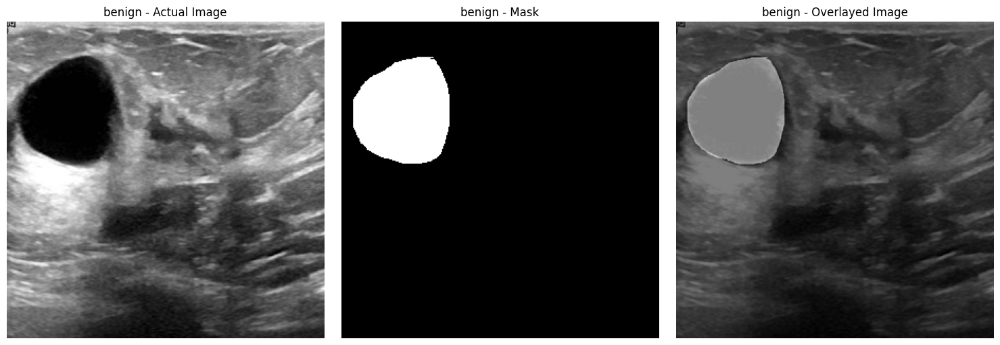

In [49]:
# %%
import os
from PIL import Image
import matplotlib.pyplot as plt

# Define the directory paths
input_dir = r"./Dataset_BUSI_with_GT"  
overlayed_dir = r"./working/OverlayedImages/benign"

# Create a figure to display the images
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Desired width and height for display
desired_width = 300
desired_height = 300

# Select an image (change the index as needed)
image_filename = 'benign (10).png'

# Construct the file paths
actual_image_path = os.path.join(input_dir, 'benign', image_filename)
mask_image_path = os.path.join(input_dir, 'benign', image_filename.replace(".png", "_mask.png"))
overlayed_image_path = os.path.join(overlayed_dir, image_filename)

# Check if files exist
if not os.path.exists(actual_image_path):
    raise FileNotFoundError(f"File not found: {actual_image_path}")
if not os.path.exists(mask_image_path):
    raise FileNotFoundError(f"File not found: {mask_image_path}")
if not os.path.exists(overlayed_image_path):
    raise FileNotFoundError(f"File not found: {overlayed_image_path}")

# Load the images
actual_image = Image.open(actual_image_path)
mask_image = Image.open(mask_image_path)
overlayed_image = Image.open(overlayed_image_path)

# Resize the images
actual_image = actual_image.resize((desired_width, desired_height), Image.Resampling.LANCZOS)
mask_image = mask_image.resize((desired_width, desired_height), Image.Resampling.LANCZOS)
overlayed_image = overlayed_image.resize((desired_width, desired_height), Image.Resampling.LANCZOS)

# Display the images
axs[0].imshow(actual_image)
axs[0].set_title('benign - Actual Image')
axs[0].axis('off')

axs[1].imshow(mask_image, cmap='gray')
axs[1].set_title('benign - Mask')
axs[1].axis('off')

axs[2].imshow(overlayed_image)
axs[2].set_title('benign - Overlayed Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()



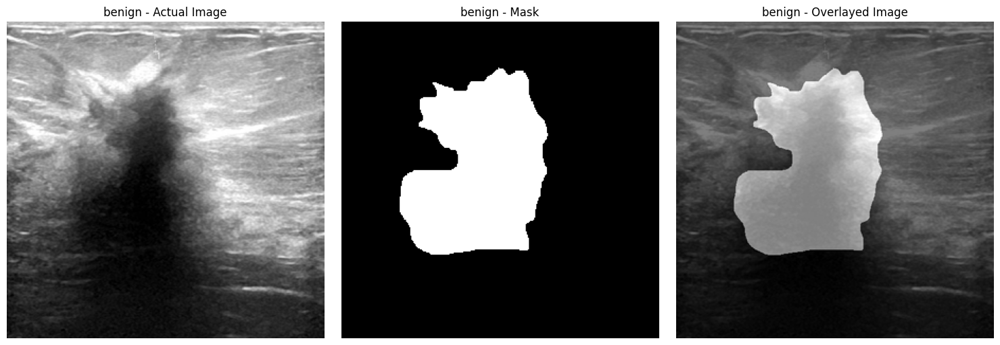

In [50]:
# %%
# Define the directory paths
input_dir = r"./Dataset_BUSI_with_GT"  
overlayed_dir = r"./working/OverlayedImages/malignant"

# Create a figure to display the images
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Desired width and height for display
desired_width = 300
desired_height = 300

# Select an image (change the index as needed)
image_filename = 'malignant (103).png'

# Construct the file paths
actual_image_path = os.path.join(input_dir, 'malignant', image_filename)
mask_image_path = os.path.join(input_dir, 'malignant', image_filename.replace(".png", "_mask.png"))
overlayed_image_path = os.path.join(overlayed_dir, image_filename)

# Load the images
actual_image = Image.open(actual_image_path)
mask_image = Image.open(mask_image_path)
overlayed_image = Image.open(overlayed_image_path)

# Resize the images
actual_image = actual_image.resize((desired_width, desired_height), Image.Resampling.LANCZOS)
mask_image = mask_image.resize((desired_width, desired_height), Image.Resampling.LANCZOS)
overlayed_image = overlayed_image.resize((desired_width, desired_height), Image.Resampling.LANCZOS)

# Display the images
axs[0].imshow(actual_image)
axs[0].set_title('benign - Actual Image')
axs[0].axis('off')

axs[1].imshow(mask_image, cmap='gray')
axs[1].set_title('benign - Mask')
axs[1].axis('off')

axs[2].imshow(overlayed_image)
axs[2].set_title('benign - Overlayed Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()



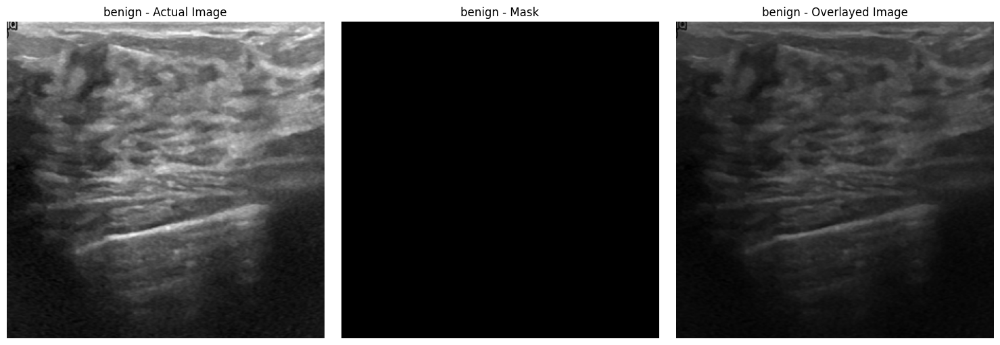

In [51]:
# %%
# Define the directory paths
input_dir = r"./Dataset_BUSI_with_GT"  
overlayed_dir = r"./working/OverlayedImages/normal"


# Create a figure to display the images
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Desired width and height for display
desired_width = 300
desired_height = 300

# Select an image (change the index as needed)
image_filename = 'normal (1).png'

# Construct the file paths
actual_image_path = os.path.join(input_dir, 'normal', image_filename)
mask_image_path = os.path.join(input_dir, 'normal', image_filename.replace(".png", "_mask.png"))
overlayed_image_path = os.path.join(overlayed_dir, image_filename)

# Load the images
actual_image = Image.open(actual_image_path)
mask_image = Image.open(mask_image_path)
overlayed_image = Image.open(overlayed_image_path)

# Resize the images
actual_image = actual_image.resize((desired_width, desired_height), Image.Resampling.LANCZOS)
mask_image = mask_image.resize((desired_width, desired_height), Image.Resampling.LANCZOS)
overlayed_image = overlayed_image.resize((desired_width, desired_height), Image.Resampling.LANCZOS)

# Display the images
axs[0].imshow(actual_image)
axs[0].set_title('benign - Actual Image')
axs[0].axis('off')

axs[1].imshow(mask_image, cmap='gray')
axs[1].set_title('benign - Mask')
axs[1].axis('off')

axs[2].imshow(overlayed_image)
axs[2].set_title('benign - Overlayed Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()


In [52]:
# %%
# Define the minority classes in your dataset
class_names = ['malignant', 'normal','benign']
minority_classes = ['malignant', 'normal']

# Define custom data transformations for minority classes
minority_class_transforms = transforms.Compose([
    RandomHorizontalFlip(p=0.9),  # Apply with 90% probability
    RandomRotation(15, expand=False, center=None),
    ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
])

# Define data transformations for train, validation, and test sets
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        # Apply custom augmentations to minority classes
        transforms.RandomApply([minority_class_transforms], p=0.5) if any(cls in minority_classes for cls in class_names) else transforms.RandomApply([], p=0.0),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'validation': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}


In [53]:
# %%
# Set the path to your input folder
data_dir = r"./working/OverlayedImages"
# Create a list to store file paths and labels
file_paths = []
labels = []

# Loop through the subdirectories (benign, malignant, normal)
for label in os.listdir(data_dir):
    label_dir = os.path.join(data_dir, label)
    if os.path.isdir(label_dir):
        for image_file in os.listdir(label_dir):
            if image_file.endswith('.png') and not (image_file.endswith('_mask.png') or 
                                                     image_file.endswith('_mask_1.png') or
                                                     image_file.endswith('_mask_2.png')):
                image_path = os.path.join(label_dir, image_file)
                labels.append(label)
                file_paths.append(image_path)

# Create a DataFrame to store the file paths and labels
data = pd.DataFrame({'Image_Path': file_paths, 'Label': labels})

# Split the dataset into train, validation, and test sets
train_data, test_data = train_test_split(data, test_size=0.15, random_state=42, stratify=data['Label'])
train_data, val_data = train_test_split(train_data, test_size=0.15, random_state=42, stratify=train_data['Label'])

# Define the paths for the train, validation, and test directories
train_dir = r"./working/train"
val_dir = r"./working/validation"
test_dir = r"./working/test"

# Create the train, validation, and test directories and subdirectories
for label in labels:
    os.makedirs(os.path.join(train_dir, label), exist_ok=True)
    os.makedirs(os.path.join(val_dir, label), exist_ok=True)
    os.makedirs(os.path.join(test_dir, label), exist_ok=True)

# Copy the images to the corresponding directories
for _, row in train_data.iterrows():
    image_path = row['Image_Path']
    label = row['Label']
    shutil.copy(image_path, os.path.join(train_dir, label))

for _, row in val_data.iterrows():
    image_path = row['Image_Path']
    label = row['Label']
    shutil.copy(image_path, os.path.join(val_dir, label))

for _, row in test_data.iterrows():
    image_path = row['Image_Path']
    label = row['Label']
    shutil.copy(image_path, os.path.join(test_dir, label))


In [54]:
# %%
import os
train_dir = r"./working/train"

# List the subdirectories (benign, malignant, normal)
subdirectories = ['benign', 'malignant', 'normal']

# Dictionary to store file counts
file_counts = {}

# Loop through the subdirectories and count files in each
for subdirectory in subdirectories:
    subdirectory_path = os.path.join(train_dir, subdirectory)
    if os.path.exists(subdirectory_path):
        file_count = len(os.listdir(subdirectory_path))
        file_counts[subdirectory] = file_count

# Print the file counts
for category, count in file_counts.items():
   # print("Train folder counts including masks:")
    print(f"Train {category}: {count}")

validation_dir = r"./working/validation"

# List the subdirectories (benign, malignant, normal)
subdirectories = ['benign', 'malignant', 'normal']

# Dictionary to store file counts
file_counts = {}

# Loop through the subdirectories and count files in each
for subdirectory in subdirectories:
    subdirectory_path = os.path.join(validation_dir, subdirectory)
    if os.path.exists(subdirectory_path):
        file_count = len(os.listdir(subdirectory_path))
        file_counts[subdirectory] = file_count

# Print the file counts
for category, count in file_counts.items():
    #print("Validation folder counts including masks:")
    print(f"Validation {category}: {count}")


test_dir = r"./working/test"

# List the subdirectories (benign, malignant, normal)
subdirectories = ['benign', 'malignant', 'normal']

# Dictionary to store file counts
file_counts = {}

# Loop through the subdirectories and count files in each
for subdirectory in subdirectories:
    subdirectory_path = os.path.join(test_dir, subdirectory)
    if os.path.exists(subdirectory_path):
        file_count = len(os.listdir(subdirectory_path))
        file_counts[subdirectory] = file_count

# Print the file counts
for category, count in file_counts.items():
    #print("test folder counts including masks:")
    print(f"test {category}: {count}")


Train benign: 315
Train malignant: 152
Train normal: 96
Validation benign: 56
Validation malignant: 27
Validation normal: 17
test benign: 66
test malignant: 31
test normal: 20


准备数据加载器，输出标签

In [55]:
# %%
data_dir= r"./working"
# Create datasets for train, validation, and test
image_datasets = {
    x: ImageFolder(
        root=os.path.join(data_dir, x),
        transform=data_transforms[x]
    )
    for x in ['train', 'validation', 'test']
}

# Specify batch size for dataloaders
batch_size = 8  # You can adjust this based on your hardware and preferences

# Create dataloaders for train, validation, and test
dataloaders = {x: DataLoader(image_datasets[x], batch_size=batch_size, shuffle=True, num_workers=4)
               for x in ['train', 'validation', 'test']}

# Calculate dataset sizes
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'validation', 'test']}

# Get class labels
class_names = image_datasets['train'].classes

# Print dataset sizes and class labels
print("Dataset Sizes:", dataset_sizes)
print("Class Labels:", class_names)


Dataset Sizes: {'train': 563, 'validation': 100, 'test': 117}
Class Labels: ['benign', 'malignant', 'normal']


## 2)简介模型，pytorch代码实现（4分） 

本实验使用的CNN模型是通过微调fine-tuning预训练的ResNet-101模型进行迁移学习。该ResNet具有101层，可以在更深层次的网络中解决梯度消失和信息流失的问题。该模型利用ResNet从而引入了残差学习，在每层的输入输出添加了跳跃连接，达到了优化，训练效果更好。

In [16]:
# %%
# Define the training function with early stopping and additional features
def train_model_with_early_stopping(model, lossFunction, optimizer, scheduler, dataloaders, dataset_sizes, class_names, device, num_epochs=20, patience=2):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = float('inf')  # Initialize best_loss with a large value
    consecutive_epochs_without_improvement = 0

    # Lists to store training and validation losses
    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'validation']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # Zero the parameter gradients
                optimizer.zero_grad()

                # Forward
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = lossFunction(outputs, labels)

                    # Backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # Append training loss here
                if phase == 'train':
                    train_losses.append(loss.item())  # Append training loss
                else:
                    val_losses.append(loss.item())  # Append validation loss

                # Statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # Early stopping: Check if validation loss improved
            if phase == 'validation':
                if epoch_loss < best_loss:
                    best_loss = epoch_loss
                    best_model_wts = copy.deepcopy(model.state_dict())
                    consecutive_epochs_without_improvement = 0
                else:
                    consecutive_epochs_without_improvement += 1


                val_losses.append(epoch_loss)

        # Check if early stopping criteria are met
        if consecutive_epochs_without_improvement >= patience:
            print(f"Early stopping after {epoch} epochs")
            break

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Loss: {:.4f}'.format(best_loss))
   
    # Load best model weights
    model.load_state_dict(best_model_wts)
    
    # Calculate classification report and confusion matrix for validation data
    y_true = []
    y_pred = []

    model.eval()  # Set model to evaluation mode

    with torch.no_grad():
        for inputs, labels in dataloaders['validation']:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())

    # Generate classification report
    target_names = [str(class_names[i]) for i in range(len(class_names))]
    print(classification_report(y_true, y_pred, target_names=target_names))

    # Generate confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    print("Confusion Matrix:")
    print(cm)

    return model


In [17]:
# %%
Resnet101 = models.resnet101(weights=True)

print(Resnet101)

for param in Resnet101.parameters():
    param.requires_grad = True

in_features = Resnet101.fc.in_features

Resnet101.fc = nn.Linear(in_features, len(class_names))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
Resnet_fineTuning = Resnet101.to(device)




/root/miniconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [11:21<00:00, 262kB/s] 


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [18]:
# %%
#Define optimzation algorithm
optimizer = optim.Adam(Resnet_fineTuning.parameters(), lr=0.00005)

# Decay LR by a factor of 0.1 every 7 epochs
Decay_Learning_Rate = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

#Define loss functions
Loss_Function = nn.CrossEntropyLoss()


微调并训练

In [20]:
# %%
model_fineTuning = train_model_with_early_stopping(
    Resnet_fineTuning, Loss_Function, optimizer, Decay_Learning_Rate, 
    dataloaders, dataset_sizes, class_names, device,num_epochs=20, patience=2)
torch.save(model_fineTuning, "./working/Resnet_fineTuning.pth")


Epoch 0/19
----------
train Loss: 0.1734 Acc: 0.9538
validation Loss: 0.5026 Acc: 0.9600

Epoch 1/19
----------
train Loss: 0.0870 Acc: 0.9734
validation Loss: 0.6502 Acc: 0.9700

Epoch 2/19
----------
train Loss: 0.0732 Acc: 0.9787
validation Loss: 0.3890 Acc: 0.9600

Epoch 3/19
----------
train Loss: 0.0731 Acc: 0.9787
validation Loss: 0.2914 Acc: 0.9600

Epoch 4/19
----------
train Loss: 0.0643 Acc: 0.9787
validation Loss: 0.1772 Acc: 0.9700

Epoch 5/19
----------
train Loss: 0.0404 Acc: 0.9893
validation Loss: 0.3994 Acc: 0.9600

Epoch 6/19
----------
train Loss: 0.0256 Acc: 0.9964
validation Loss: 0.1934 Acc: 0.9700
Early stopping after 6 epochs
Training complete in 0m 56s
Best val Loss: 0.1772
              precision    recall  f1-score   support

      benign       0.95      1.00      0.97        56
   malignant       1.00      0.89      0.94        27
      normal       1.00      1.00      1.00        17

    accuracy                           0.97       100
   macro avg       

## 3) 合理评估模型。对任务一，比较至少一种基准模型（如经典机器学习，MLP等）（3分） 

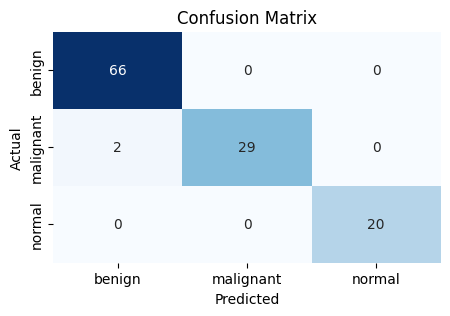

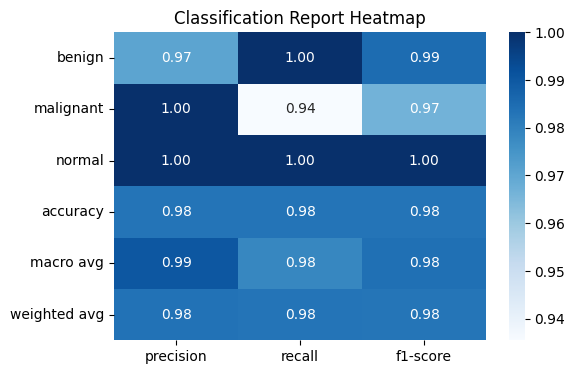

Simplified Classification Report:
             benign  malignant  normal  accuracy  macro avg  weighted avg
precision  0.970588   1.000000     1.0  0.982906   0.990196      0.983409
recall     1.000000   0.935484     1.0  0.982906   0.978495      0.982906
f1-score   0.985075   0.966667     1.0  0.982906   0.983914      0.982749


In [21]:
# %%
# Define label names
label_names = [str(class_names[i]) for i in range(len(class_names))]

# Calculate classification report and confusion matrix on unseen test data
y_true = []
y_pred = []

model_fineTuning.eval()  # Set model to evaluation mode

with torch.no_grad():
    for inputs, labels in dataloaders['test']:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model_fineTuning(inputs)
        _, preds = torch.max(outputs, 1)

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# Generate classification report
classification_rep = classification_report(y_true, y_pred, target_names=label_names, output_dict=True)

# Generate confusion matrix
confusion_mat = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix with label names
plt.figure(figsize=(5, 3))
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=label_names, yticklabels=label_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Convert the classification report to a heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(pd.DataFrame(classification_rep).iloc[:-1, :].T, annot=True, cmap='Blues', fmt='.2f')  # Simplify classification report
plt.title('Classification Report Heatmap')
plt.show()

# Print the simplified classification report
print("Simplified Classification Report:")
print(pd.DataFrame(classification_rep).iloc[:-1, :])


可视化预测和真实结果对比

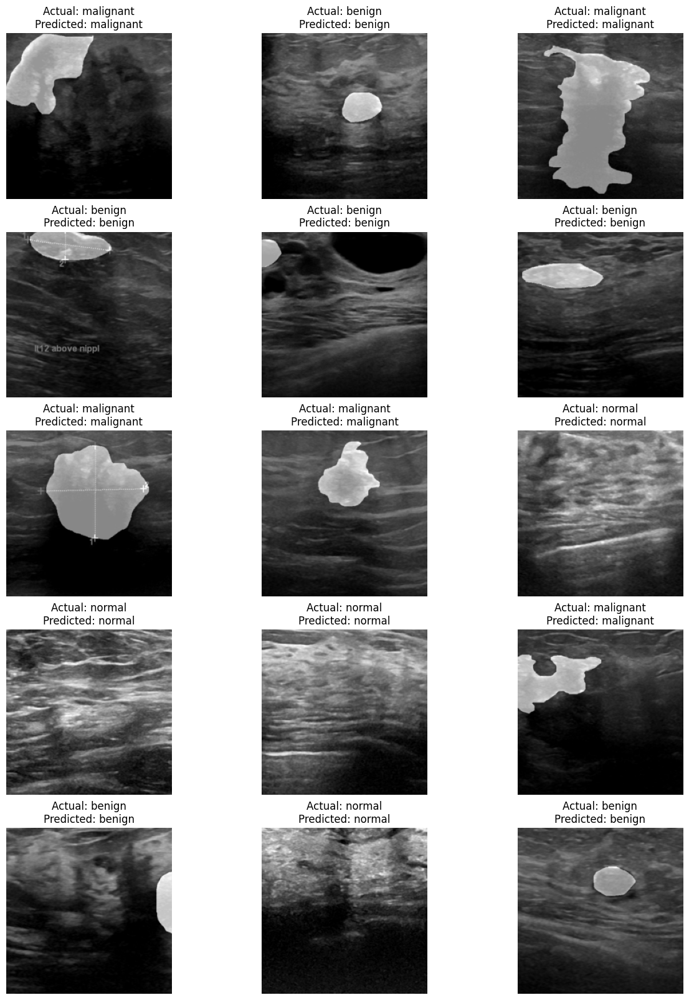

In [22]:
# %%
import numpy as np
import matplotlib.pyplot as plt

# Set the number of images to display
num_images_to_display = 15

# Create a DataLoader for the test dataset
test_dataloader = DataLoader(image_datasets['test'], batch_size=num_images_to_display, shuffle=True, num_workers=4)

# Get a batch of test data
inputs, labels = next(iter(test_dataloader))

# Move inputs to the device
inputs = inputs.to(device)

# Convert images to grayscale
grayscale_images = inputs.cpu().numpy().mean(axis=1)  # Convert RGB to grayscale

# Get model predictions
with torch.no_grad():
    model_fineTuning.eval()
    outputs = model_fineTuning(inputs)
    _, preds = torch.max(outputs, 1)

# Plot the grayscale images with labels and predictions
plt.figure(figsize=(15, 20))  # Increase the height to accommodate 5 rows
for i in range(num_images_to_display):
    ax = plt.subplot(5, 3, i + 1)  # Adjust the layout to 5 rows by 3 columns
    ax.axis('off')
    ax.set_title(f'Actual: {class_names[labels[i]]}\nPredicted: {class_names[preds[i]]}')
    plt.imshow(grayscale_images[i], cmap='gray')  # Display the grayscale image

plt.show()


MLP

In [25]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# Set directories
input_dir = r"./working/OverlayedImages"
labels = ['benign', 'malignant', 'normal']
image_size = (300, 300)  # Resize images to 300x300

# Define custom dataset class
class ImageDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        label = self.labels[idx]
        
        # Open and transform image
        image = Image.open(image_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        
        return image, label

# Image preprocessing
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # Standard normalization
])

# Load dataset
image_paths = []
image_labels = []

for label in labels:
    label_dir = os.path.join(input_dir, label)
    for image_filename in os.listdir(label_dir):
        if image_filename.endswith('.png'):
            image_paths.append(os.path.join(label_dir, image_filename))
            image_labels.append(label)

# Encode labels as integers
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(image_labels)

# Split the data into training, validation, and test sets
X_train, X_test, y_train, y_test = train_test_split(image_paths, encoded_labels, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

# Create DataLoader for train, validation, and test sets
train_dataset = ImageDataset(X_train, y_train, transform=transform)
val_dataset = ImageDataset(X_val, y_val, transform=transform)
test_dataset = ImageDataset(X_test, y_test, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Define the MLP model
class MLP(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, num_classes)
    
    def forward(self, x):
        x = x.view(x.size(0), -1)  # Flatten the image
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        return x

# Initialize the model
model = MLP(input_size=300*300*3, hidden_size=512, num_classes=len(labels))

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training function
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=10):
    best_val_loss = float('inf')
    
    for epoch in range(num_epochs):
        model.train()  # Set the model to training mode
        running_loss = 0.0
        
        for inputs, targets in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        
        avg_train_loss = running_loss / len(train_loader)
        
        # Evaluate on validation set
        model.eval()  # Set the model to evaluation mode
        val_loss = 0.0
        correct = 0
        total = 0
        
        with torch.no_grad():
            for inputs, targets in val_loader:
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                val_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                total += targets.size(0)
                correct += (predicted == targets).sum().item()
        
        avg_val_loss = val_loss / len(val_loader)
        val_accuracy = 100 * correct / total
        
        print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")
        
        # Save the best model based on validation loss
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save(model.state_dict(), 'best_mlp_model.pth')
    
    print("Training completed.")

# Train the model
train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=10)

# Load the best model
model.load_state_dict(torch.load('best_mlp_model.pth'))


Epoch [1/10], Train Loss: 160.9124, Validation Loss: 50.9863, Validation Accuracy: 47.62%
Epoch [2/10], Train Loss: 15.7199, Validation Loss: 10.4817, Validation Accuracy: 61.90%
Epoch [3/10], Train Loss: 9.9319, Validation Loss: 11.4213, Validation Accuracy: 55.56%
Epoch [4/10], Train Loss: 7.5429, Validation Loss: 13.0022, Validation Accuracy: 33.33%
Epoch [5/10], Train Loss: 5.0805, Validation Loss: 6.7957, Validation Accuracy: 57.14%
Epoch [6/10], Train Loss: 3.3356, Validation Loss: 6.5408, Validation Accuracy: 53.97%
Epoch [7/10], Train Loss: 2.0192, Validation Loss: 4.3543, Validation Accuracy: 53.97%
Epoch [8/10], Train Loss: 2.1561, Validation Loss: 4.7435, Validation Accuracy: 50.79%
Epoch [9/10], Train Loss: 2.8747, Validation Loss: 5.4257, Validation Accuracy: 57.14%
Epoch [10/10], Train Loss: 1.9098, Validation Loss: 4.4283, Validation Accuracy: 58.73%
Training completed.


/tmp/ipykernel_5774/3677863968.py:145: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_mlp_model.pth'))


<All keys matched successfully>

Test Accuracy: 0.6346153846153846
              precision    recall  f1-score   support

      benign       0.77      0.57      0.66        84
   malignant       0.69      0.56      0.62        43
      normal       0.46      0.93      0.61        29

    accuracy                           0.63       156
   macro avg       0.64      0.69      0.63       156
weighted avg       0.69      0.63      0.64       156



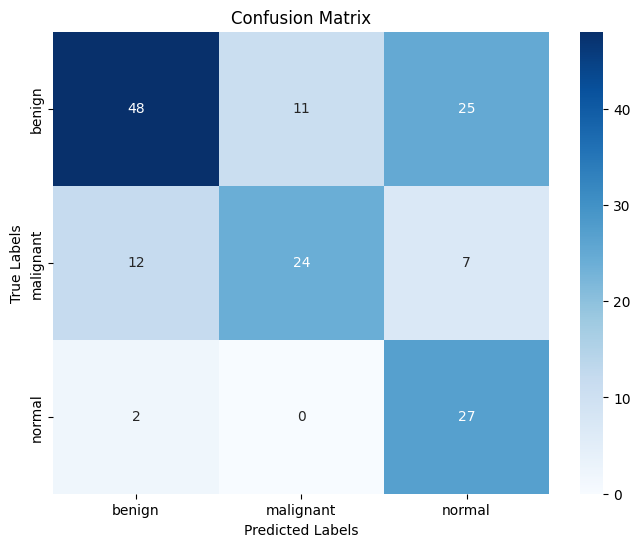

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Evaluate the model on test data and display confusion matrix
def evaluate_model(model, test_loader):
    model.eval()
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for inputs, targets in test_loader:
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(targets.cpu().numpy())
    
    # Print classification report
    print("Test Accuracy:", accuracy_score(all_labels, all_preds))
    print(classification_report(all_labels, all_preds, target_names=label_encoder.classes_))
    
    # Compute confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    
    # Plot confusion matrix using seaborn
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

# Evaluate the model with the added confusion matrix visualization
evaluate_model(model, test_loader)


对模型评估的对比总结如下：

| 指标               | ResNet-101                                                                                     | MLP                                                                                     |
|--------------------|-----------------------------------------------------------------------------------------------|----------------------------------------------------------------------------------------|
| **整体准确率**      | 模型的整体准确率高达 **97%**，能够非常准确地对测试数据集中的图像进行分类，几乎没有错误分类。          | 模型的整体准确率仅为 **58%**，在分类任务中表现较差，大量样本被错误分类，尤其是某些类别。        |
| **分类均衡性**      | 对所有类别（`benign`、`malignant`、`normal`）的分类表现非常均衡，每个类别的精确率和召回率都很高。  | 分类不均衡问题严重，模型对类别 `normal` 的分类效果特别差，召回率和精确率都远低于其他类别。       |
| **复杂度适应性**    | ResNet-101 能够很好地处理复杂的图像数据，利用卷积神经网络提取高级特征，适合处理边缘、纹理等图像细节。   | MLP 模型对复杂图像的适应性较差，因为它缺乏卷积层，无法有效提取图像的空间结构信息，只能学习简单的特征。|
| **误分类情况**      | 几乎没有误分类，仅有一个 `malignant` 样本被错误分类为 `benign`，其他类别的分类完全正确。               | 误分类现象非常严重，尤其是在 `malignant` 和 `normal` 类别中。大量 `normal` 样本被错误分类为其他类别。|
| **优缺点**          | ResNet-101 模型具有很高的精度和召回率，且在不同类别之间表现稳健。模型通过预训练权重有效减少训练时间，并很好地适应复杂任务。 | MLP 模型实现简单、训练速度快，但在图像分类任务上性能较差，适应复杂数据的能力不足，不适合高精度任务。 |

ResNet-101 明显优于 MLP的可能原因如下：

1.特征提取能力:

ResNet-101 是一种深度卷积神经网络，能够从图像中提取低级到高级特征，尤其适合图像数据。
MLP 是全连接网络，没有卷积层，无法很好地提取图像的空间特征，对图像数据处理效果有限。

2.预训练模型的优势:

ResNet-101 使用了在 ImageNet 数据集上预训练的权重，因此已经学习了丰富的特征，微调只需对特定任务进行适配。
MLP 是从头开始训练的，没有利用预训练的知识，因此效果较差。

3.数据增强与适配性:

ResNet-101 适合于较复杂的数据增强策略（如翻转、旋转、颜色抖动等），能够更好地泛化。
MLP 缺乏对空间特征的捕捉能力，即使使用数据增强效果也有限。

4.模型复杂度:

ResNet-101 有更多的参数和更复杂的结构，适合处理大规模数据集和复杂任务。
MLP 模型相对简单，无法胜任复杂图像分类任务。

 # Task 2: Segmentation

 ## 1）导入并清洗数据(3分) 

In [58]:
# %%
def load_image(image_path, size, is_mask=False):
    # Load and transform image
    image = Image.open(image_path)
    
    if is_mask:
        # For masks: convert to grayscale and don't normalize
        transform = transforms.Compose([
            transforms.Resize((size, size)),
            transforms.Grayscale(num_output_channels=1),  # Ensure single channel
            transforms.ToTensor(),
        ])
    else:
        # For regular images: convert to RGB and normalize
        if image.mode != 'RGB':
            image = image.convert('RGB')
        transform = transforms.Compose([
            transforms.Resize((size, size)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                               std=[0.229, 0.224, 0.225])
        ])
    return transform(image)

def load_images(image_paths, SIZE, mask=False):
    if mask:
        images = np.zeros((len(image_paths), SIZE, SIZE, 1))  # 单通道目标数组
    else:
        images = np.zeros((len(image_paths), SIZE, SIZE, 3))  # 三通道目标数组

    for i, image in enumerate(image_paths):
        img = load_image(image, SIZE)

        if mask:
            # 确保 Mask 是单通道
            if img.shape[0] == 3:  # 如果是多通道格式 (channels, height, width)
                images[i] = img[0, :, :].reshape(SIZE, SIZE, 1)  # 取第一个通道
            else:  # 单通道格式
                images[i] = img.reshape(SIZE, SIZE, 1)  # 确保形状一致
        else:
            # 确保 RGB 图像是三通道
            if img.shape[0] == 3:  # 通道优先格式
                images[i] = np.transpose(img, (1, 2, 0))  # 调整为 (256, 256, 3)
            elif img.shape[-1] == 1:  # 如果是灰度图像，扩展到三通道
                images[i] = np.repeat(img, 3, axis=-1)
            else:
                images[i] = img  # 如果是 (256, 256, 3)，直接赋值

    return images



def show_image(image, title=None, cmap=None, alpha=1):
    # Convert from PyTorch tensor format (C,H,W) to numpy format (H,W,C)
    if torch.is_tensor(image):
        if image.shape[0] == 1:  # If single channel
            image = image.squeeze(0)
        else:
            image = image.permute(1, 2, 0)
        image = image.cpu().numpy()
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, cmap=None, alpha=0.4):
    # Convert tensors to numpy arrays in correct format
    if torch.is_tensor(image):
        if image.shape[0] == 1:  # If single channel
            image = image.squeeze(0)
        else:
            image = image.permute(1, 2, 0)
        image = image.cpu().numpy()
    
    if torch.is_tensor(mask):
        mask = mask.squeeze().cpu().numpy()
    
    plt.imshow(image)
    plt.imshow(mask, cmap=cmap, alpha=alpha)
    plt.axis('off')


In [59]:
# %%
SIZE = 256


In [22]:
# %%
input_dir = r"./Dataset_BUSI_with_GT"  
classes = sorted(os.listdir(input_dir))
classes


['benign', 'malignant', 'normal']

In [24]:
# %%
single_mask_paths = sorted([sorted(glob(os.path.join(input_dir, name, "*_mask.png"))) for name in classes])
double_mask_paths = sorted([sorted(glob(os.path.join(input_dir, name, "*_mask_1.png"))) for name in classes])


In [25]:
# %%
image_paths = []
mask_paths = []
for class_path in single_mask_paths:
    for path in class_path:
        img_path = path.replace('_mask','')
        image_paths.append(img_path)
        mask_paths.append(path)


In [26]:
images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007792949676514..2.640000104904175].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7069098949432373..2.640000104904175].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.6225709915161133].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.5877127647399902].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.6225709915161133].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665297508239746..2.640000104904175].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.1519827842712402].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.032280206680298..2.6225709915161133].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.640000104904175].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.640000104904175].
Clipping input data to the valid range

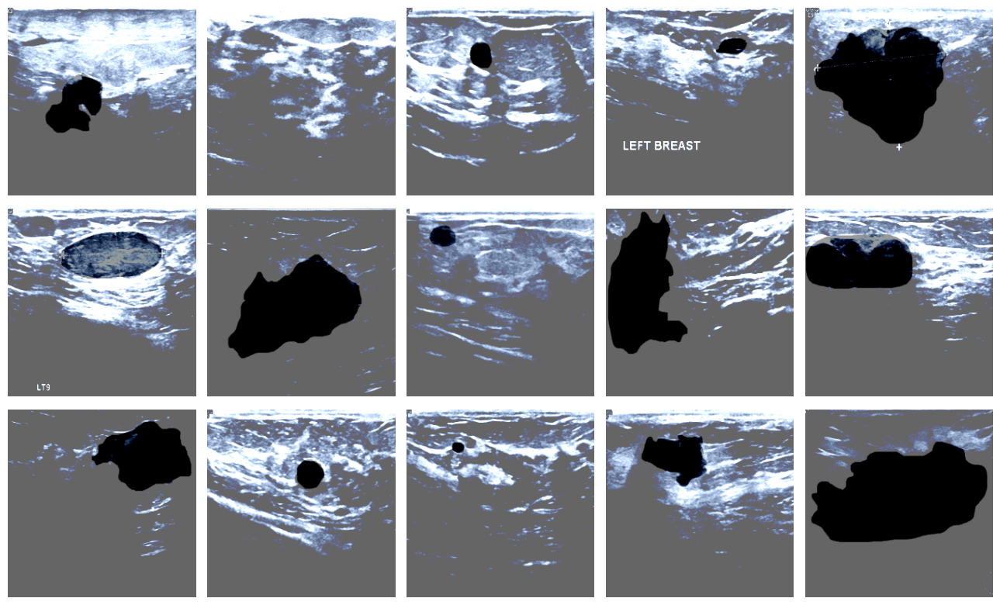

In [27]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='binary')
plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.980906..2.64].


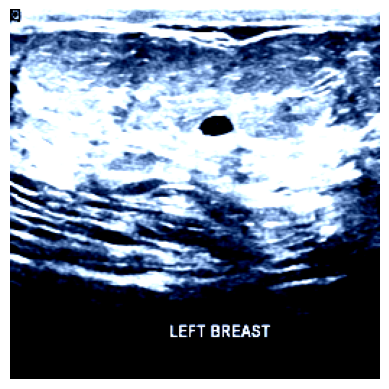

In [28]:
# %%
show_image(load_image(image_paths[0], SIZE, is_mask=False))


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.980906..2.64].


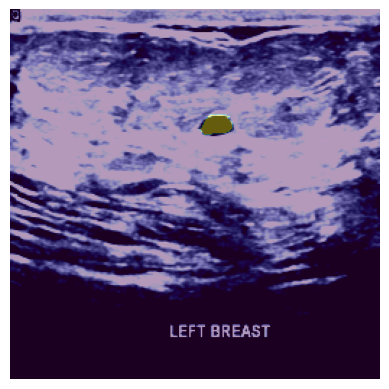

In [102]:
# %%
show_mask(load_image(image_paths[0], SIZE, is_mask=False), 
         load_image(mask_paths[0], SIZE, is_mask=True))


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].


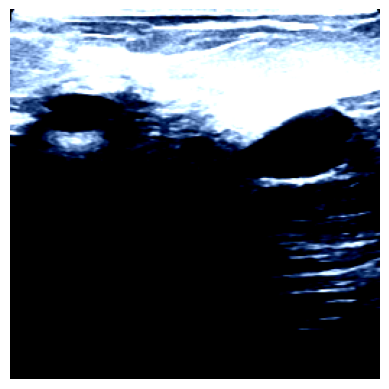

In [103]:
# %%
show_image(load_image('./Dataset_BUSI_with_GT/benign/benign (100).png', SIZE, is_mask=False))


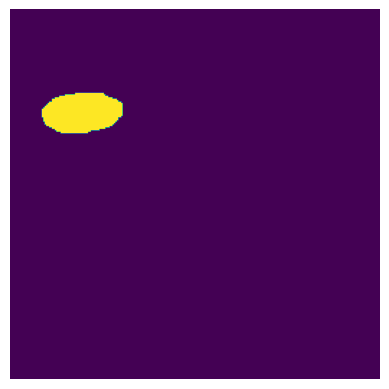

In [104]:
# %%
show_image(load_image('./Dataset_BUSI_with_GT/benign/benign (100)_mask_1.png', SIZE, is_mask=True))


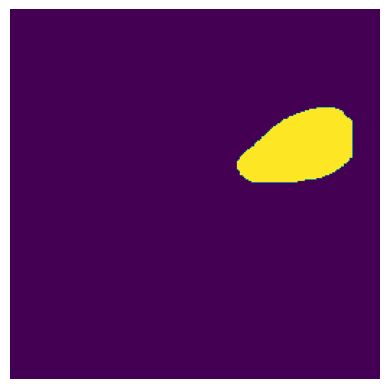

In [105]:
# %%
show_image(load_image('./Dataset_BUSI_with_GT/benign/benign (100)_mask.png', SIZE, is_mask=True))


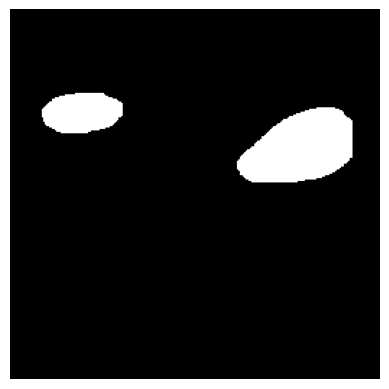

In [106]:
# %%
# Create a zero tensor with the same shape as our masks
img = torch.zeros((SIZE, SIZE))  # Changed to 2D tensor

# Load masks as tensors
mask1 = load_image('./Dataset_BUSI_with_GT/benign/benign (100)_mask_1.png', SIZE, is_mask=True)
mask2 = load_image('./Dataset_BUSI_with_GT/benign/benign (100)_mask.png', SIZE, is_mask=True)

# Convert masks to numpy arrays and combine them
mask1_np = mask1.squeeze().numpy()  # Remove channel dimension
mask2_np = mask2.squeeze().numpy()  # Remove channel dimension
img_np = img.numpy()

# Add the masks to the zero array
combined_mask = img_np + mask1_np + mask2_np

# Show the combined mask
show_image(combined_mask, cmap='gray')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].


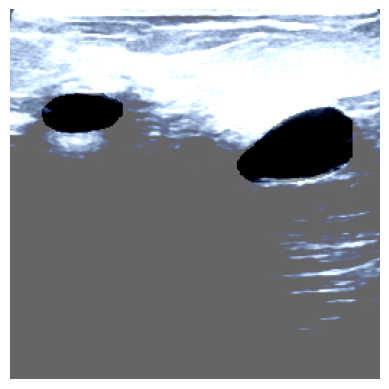

In [107]:
# %%
show_image(load_image('./Dataset_BUSI_with_GT/benign/benign (100).png', SIZE, is_mask=False))
plt.imshow(combined_mask, cmap='binary', alpha=0.4)
plt.axis('off')
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].


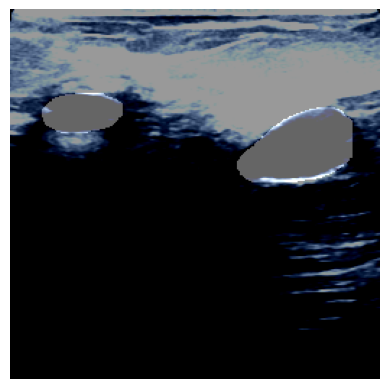

In [108]:
# %%
show_image(load_image('./Dataset_BUSI_with_GT/benign/benign (100).png', SIZE, is_mask=False))
plt.imshow(combined_mask, cmap='gray', alpha=0.4)
plt.axis('off')
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].


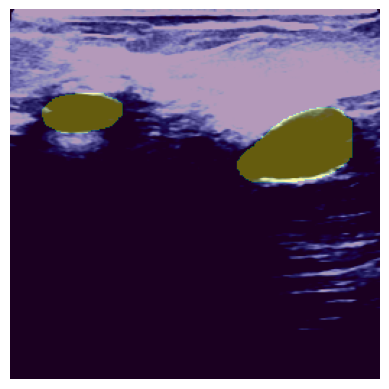

In [109]:
# %%
show_image(load_image('./Dataset_BUSI_with_GT/benign/benign (100).png', SIZE, is_mask=False))
plt.imshow(combined_mask, alpha=0.4)
plt.axis('off')
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.4482791423797607].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007792949676514..2.640000104904175].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544036865234..2.6225709915161133].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.5877127647399902].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8952821493148804..2.6225709915161133].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.5702831745147705].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665297508239746..2.517995834350586].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544036865234..2.640000104904175].
Clipping input data to the val

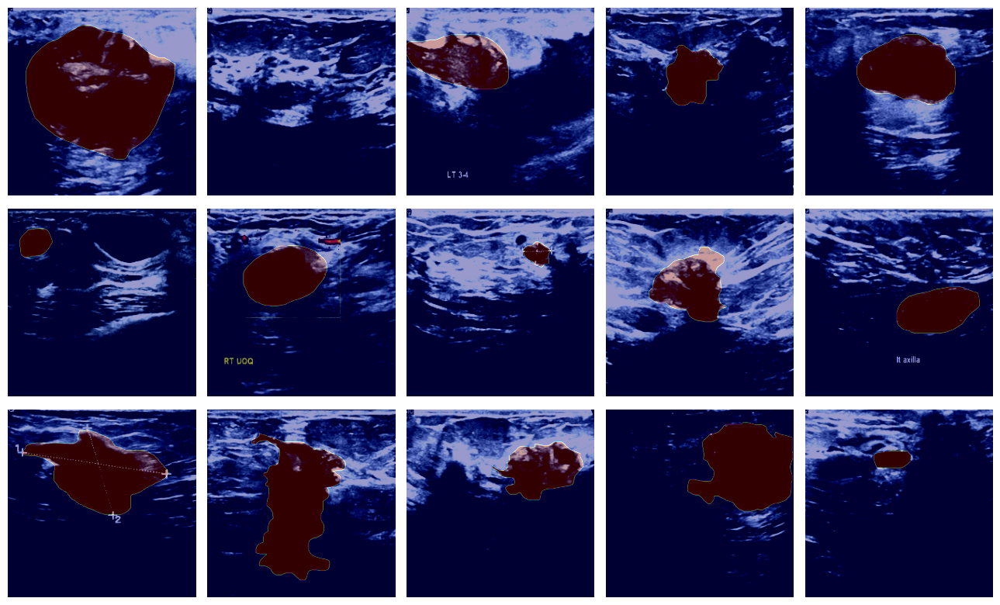

In [29]:
# %%
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='jet')
plt.tight_layout()
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.640000104904175].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.552854299545288].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.6225709915161133].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007792949676514..2.047407627105713].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.809658408164978..2.0648367404937744].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.032280206680298..2.640000104904175].
Clipping input data to the valid rang

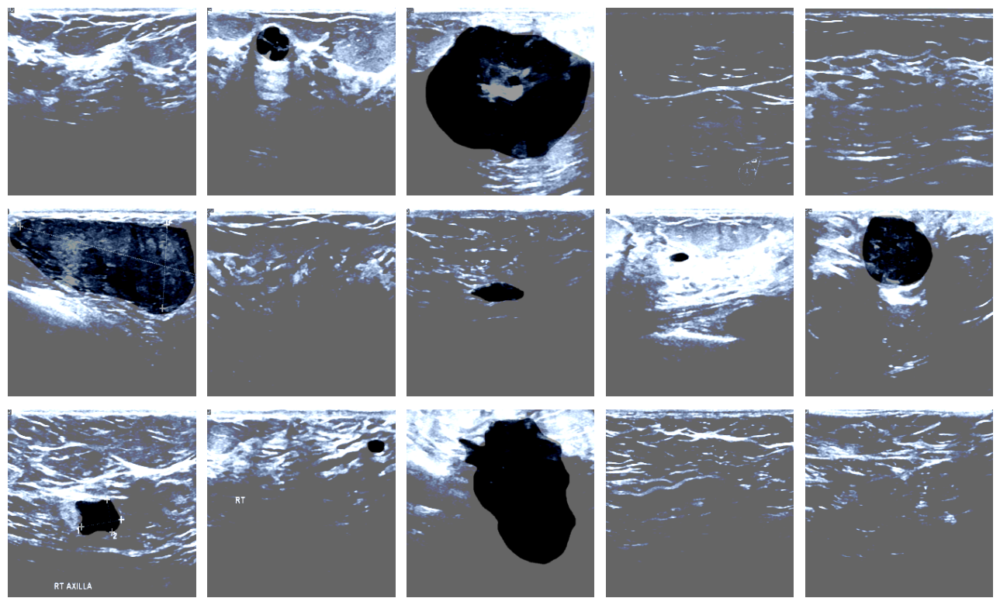

In [114]:
# %%
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='binary')
plt.tight_layout()
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494048595428467..2.6225709915161133].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007792949676514..2.640000104904175].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.640000104904175].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.640000104904175].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.4482791423797607].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.015155553817749..2.640000104904175].
Clipping input data to the valid ran

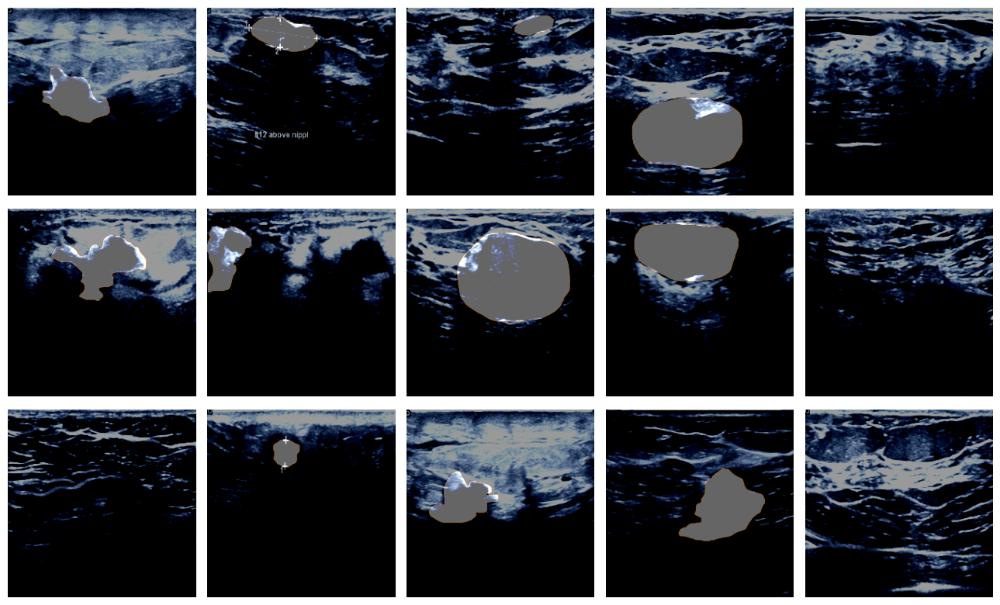

In [115]:
# %%
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='afmhot')
plt.tight_layout()
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.998030662536621..2.5877127647399902].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007792949676514..2.465708017349243].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007792949676514..2.6225709915161133].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.640000104904175].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.4482791423797607].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1179039478302..2.2565577030181885].
Clipping input data to the valid r

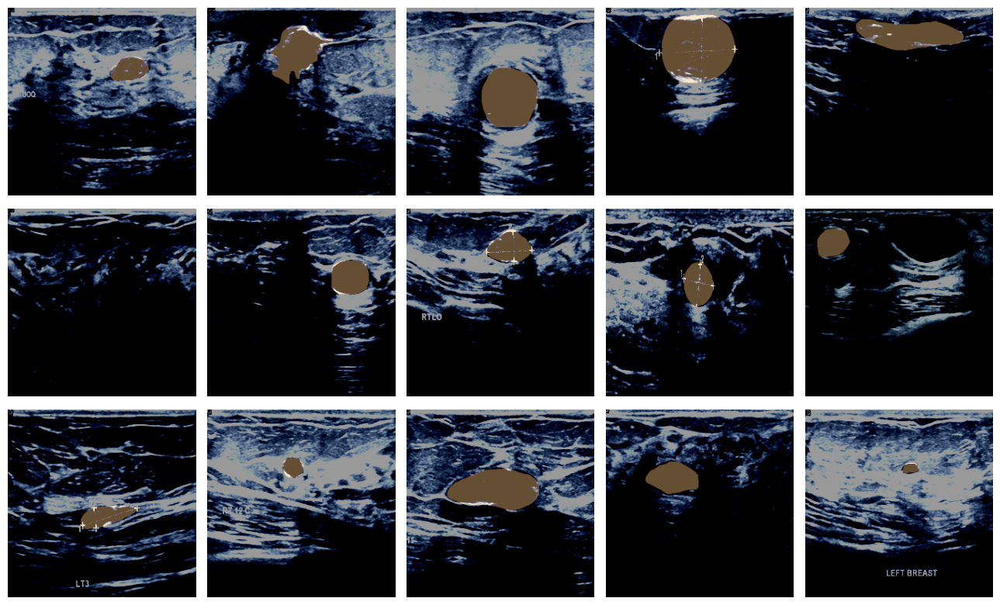

In [116]:
# %%
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='copper')
plt.tight_layout()
plt.show()


## 2)简介模型，pytorch代码实现（4分） 

 Attention U-Net 是一种改进的 U-Net 模型，主要用于医学图像分割任务，特别是在多类别分割领域有广泛应用。它在标准 U-Net 的基础上加入了注意力机制，可以更好地关注图像中需要分割的重要区域，同时抑制无关的背景信息。这种机制可以提升模型在复杂场景中的表现，尤其是当目标与背景差异较小时。

 模型主要包括三部分：编码器、解码器和注意力门。
 
* 编码器模块 (Encoder Block)：
类似于标准 U-Net，编码器模块通过一系列卷积层和下采样操作（例如 MaxPooling）提取图像的特征。
特征逐层提取，同时图像分辨率逐步减小。

* 解码器模块 (Decoder Block)：
解码器模块通过上采样操作（例如反卷积或双线性插值）逐步恢复图像的空间分辨率。
结合跳跃连接，将编码器中不同层的特征与解码器中的对应层特征拼接，帮助模型恢复更多细节。

* 注意力门 (Attention Gate)：
注意力机制用于增强解码器中需要恢复的重要特征，并忽略无关区域。
每个注意力门会动态学习编码器和解码器中传递的特征的重要性，从而更精确地进行分割。

Encoder

In [64]:
# %%
class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dropout_rate, pooling=True):
        super().__init__()
        self.pooling = pooling
        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, padding=1)
        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, padding=1) 
        self.dropout = nn.Dropout(dropout_rate)
        self.pool = nn.MaxPool2d(2) if pooling else None
        
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.dropout(x)
        x = F.relu(self.conv2(x))
        if self.pooling:
            skip = x
            x = self.pool(x)
            return x, skip
        return x


Decoder

In [65]:
# %%
class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dropout_rate):
        super().__init__()
        self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.conv = EncoderBlock(in_channels + out_channels, out_channels, dropout_rate, pooling=False)
        
    def forward(self, x, skip):
        x = self.up(x)
        x = torch.cat([x, skip], dim=1)
        x = self.conv(x)
        return x


Attention Gate

In [66]:
# %%
class AttentionGate(nn.Module):
    def __init__(self, in_channels, out_channels, use_bn=True):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, padding=1)
        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(out_channels, 1, 1)
        self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.bn = nn.BatchNorm2d(out_channels) if use_bn else None
        
    def forward(self, x, skip):
        g = F.relu(self.conv1(x))
        x = self.conv2(skip)
        x = g + x
        x = torch.sigmoid(self.conv3(x))
        x = self.up(x)
        x = x * skip
        return self.bn(x) if self.bn else x


Custom Callback

In [67]:
# %%
class ShowProgress:
    def __init__(self, model, images, masks, device):
        self.model = model
        self.images = images
        self.masks = masks
        self.device = device
    
    def show(self):
        self.model.eval()
        with torch.no_grad():
            idx = np.random.randint(len(self.images))
            image = self.images[idx].unsqueeze(0).to(self.device)
            mask = self.masks[idx]
            pred_mask = self.model(image).cpu().squeeze()

            plt.figure(figsize=(10,5))
            plt.subplot(1,2,1)
            plt.title("Original Mask")
            show_mask(self.images[idx], mask, cmap='copper')
            
            plt.subplot(1,2,2)
            plt.title("Predicted Mask")
            show_mask(self.images[idx], pred_mask, cmap='copper')
            
            plt.tight_layout()
            plt.show()


Attention U-Net

In [68]:
# %%
class AttentionUNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super().__init__()
        
        # Encoder
        self.enc1 = EncoderBlock(in_channels, 32, 0.1)
        self.enc2 = EncoderBlock(32, 64, 0.1)
        self.enc3 = EncoderBlock(64, 128, 0.2)
        self.enc4 = EncoderBlock(128, 256, 0.2)
        self.enc5 = EncoderBlock(256, 512, 0.3, pooling=False)
        
        # Attention Gates + Decoder
        self.att1 = AttentionGate(512, 256)
        self.dec1 = DecoderBlock(512, 256, 0.2)
        
        self.att2 = AttentionGate(256, 128)
        self.dec2 = DecoderBlock(256, 128, 0.2)
        
        self.att3 = AttentionGate(128, 64)
        self.dec3 = DecoderBlock(128, 64, 0.1)
        
        self.att4 = AttentionGate(64, 32)
        self.dec4 = DecoderBlock(64, 32, 0.1)
        
        self.out = nn.Conv2d(32, out_channels, 1)
        
    def forward(self, x):
        # Encoder
        x1, s1 = self.enc1(x)
        x2, s2 = self.enc2(x1) 
        x3, s3 = self.enc3(x2)
        x4, s4 = self.enc4(x3)
        x5 = self.enc5(x4)
        
        # Decoder with attention
        a1 = self.att1(x5, s4)
        d1 = self.dec1(x5, a1)
        
        a2 = self.att2(d1, s3)
        d2 = self.dec2(d1, a2)
        
        a3 = self.att3(d2, s2)
        d3 = self.dec3(d2, a3)
        
        a4 = self.att4(d3, s1)
        d4 = self.dec4(d3, a4)
        
        return torch.sigmoid(self.out(d4))


Training

In [37]:
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
import torch.nn.functional as F
import torch
from torch.utils.data import Dataset
import os
from torchvision import transforms

# Define a function to calculate accuracy and IoU
def calculate_accuracy_and_iou(preds, masks, threshold=0.5):
    preds = (preds > threshold).float()
    
    correct = (preds == masks).sum()
    total = preds.numel()
    
    accuracy = (correct / total).item()

    intersection = (preds * masks).sum()
    union = preds.sum() + masks.sum() - intersection
    iou = (intersection + 1e-6) / (union + 1e-6)  # Avoid division by zero

    return accuracy, iou

class ImageMaskDataset(Dataset):
    def __init__(self, image_paths, mask_paths, size):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.size = size
        
    def __len__(self):
        return len(self.image_paths)
        
    def __getitem__(self, idx):
        image = load_image(self.image_paths[idx], self.size, is_mask=False)
        mask = load_image(self.mask_paths[idx], self.size, is_mask=True)
        return image, mask

# Model setup and training
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Split the dataset into training and validation
dataset = ImageMaskDataset(image_paths, mask_paths, SIZE)

train_size = int(0.8 * len(dataset))  # 80% for training
val_size = len(dataset) - train_size  # Remaining 20% for validation
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

# Prepare dataloaders
train_dataloader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=4)
val_dataloader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=4)

# Model, optimizer, and loss function
model = AttentionUNet(in_channels=3, out_channels=1)
model = model.to(device)  # Move model to GPU/CPU
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.BCELoss()

train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

# Training loop
num_epochs = 20
for epoch in range(num_epochs):
    # Training phase
    model.train()
    running_loss = 0.0
    total_accuracy = 0.0
    
    for images, masks in train_dataloader:
        images = images.to(device)
        masks = masks.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        
        # Compute loss
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Compute accuracy
        accuracy, _ = calculate_accuracy_and_iou(outputs, masks)
        total_accuracy += accuracy
        
    epoch_loss = running_loss / len(train_dataloader)
    epoch_accuracy = total_accuracy / len(train_dataloader)
    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_accuracy)

    # Validation phase
    model.eval()
    val_loss = 0.0
    val_accuracy = 0.0
    
    with torch.no_grad():
        for images, masks in val_dataloader:
            images = images.to(device)
            masks = masks.to(device)
            
            outputs = model(images)
            
            # Compute loss
            loss = criterion(outputs, masks)
            val_loss += loss.item()
            
            # Compute accuracy and IoU
            accuracy, iou = calculate_accuracy_and_iou(outputs, masks)
            val_accuracy += accuracy

    val_loss /= len(val_dataloader)
    val_accuracy /= len(val_dataloader)

    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)

    # Print training and validation results
    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"Train Loss: {epoch_loss:.4f}, Train Accuracy: {epoch_accuracy:.4f}")
    print(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}")
    
    # Save checkpoint
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_loss': epoch_loss,
        'val_loss': val_loss,
    }, f'checkpoint_epoch_{epoch}.pt')


Epoch 1/20
Train Loss: 0.3418, Train Accuracy: 0.8031
Validation Loss: 0.2459, Validation Accuracy: 0.9226
Epoch 2/20
Train Loss: 0.2297, Train Accuracy: 0.9233
Validation Loss: 0.3844, Validation Accuracy: 0.9226
Epoch 3/20
Train Loss: 0.2053, Train Accuracy: 0.9262
Validation Loss: 0.2381, Validation Accuracy: 0.9232
Epoch 4/20
Train Loss: 0.1984, Train Accuracy: 0.9311
Validation Loss: 0.1943, Validation Accuracy: 0.9269
Epoch 5/20
Train Loss: 0.1998, Train Accuracy: 0.9322
Validation Loss: 0.2888, Validation Accuracy: 0.9227
Epoch 6/20
Train Loss: 0.1806, Train Accuracy: 0.9364
Validation Loss: 0.2399, Validation Accuracy: 0.9253
Epoch 7/20
Train Loss: 0.1901, Train Accuracy: 0.9346
Validation Loss: 0.2564, Validation Accuracy: 0.9228
Epoch 8/20
Train Loss: 0.1769, Train Accuracy: 0.9396
Validation Loss: 0.1781, Validation Accuracy: 0.9379
Epoch 9/20
Train Loss: 0.1787, Train Accuracy: 0.9402
Validation Loss: 0.2186, Validation Accuracy: 0.9261
Epoch 10/20
Train Loss: 0.1653, Train

## 3) 合理评估模型。（3分） 

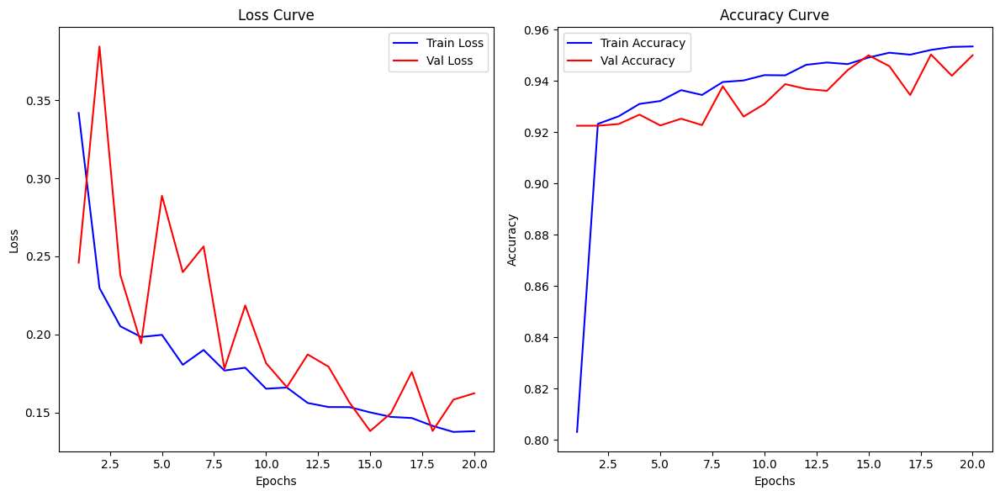

In [38]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot loss curve (train vs validation)
plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs + 1), train_losses, label="Train Loss", color='blue')
plt.plot(range(1, num_epochs + 1), val_losses, label="Val Loss", color='red')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss Curve")
plt.legend()

# Plot accuracy curve (train vs validation)
plt.subplot(1, 2, 2)
plt.plot(range(1, num_epochs + 1), train_accuracies, label="Train Accuracy", color='blue')
plt.plot(range(1, num_epochs + 1), val_accuracies, label="Val Accuracy", color='red')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy Curve")
plt.legend()

plt.tight_layout()
plt.show()



## 5）附加题（总评最多+2分，由主讲教师评定）：文献（见参考文献）指出了该数据集存在的错漏之处。请总结文献内容，更正错误，并比较修改前后模型的表现。

从上图可以看出，该模型在训练集和验证集上均能让损失下降、准确率上升，且最终准确率能达到95%左右，说明该模型的学习效果良好。但在验证集上的波动较大，说明该模型稳定性较差，并且有一定的过拟合风险，且泛化能力还有待提升。

这篇文献表明，在使用该数据集进行研究时，作者发现了一些不一致性，这些不一致性可能会对利用这些数据的研究结果产生很大的影响。

作者使用Mathematica软件的FindGeometricTransform函数对数据集中的所有图像对进行了初步的相似性分析，发现了很多重复的乳腺图像，还发现了一些图像在良性和恶性集合中都出现的情况，以及一些图像并非来自乳腺本身而是来自腋窝。
数据集中还包含了一些带有活检针的图像，以及许多带有文本或图形注释的图像，这些注释可能会干扰图像分析过程。

文章中给出的建议如下：

移除数据集中的重复项，因为它们可能导致机器学习模型过度学习某些模式，从而产生错误的预测；不要随机分割数据集为训练和测试子集，因为如果测试和训练子集中出现相同的图像，可能会偏倚结果。

数据处理

In [1]:
# 给定的重复编号集合
duplicate_pairs = [
    {1, 318}, {2, 319}, {3, 320}, {4, 321}, {5, 322}, {6, 323}, {7, 324}, {8, 325}, {9, 326}, {10, 327},
    {11, 328}, {12, 329}, {13, 330}, {14, 331}, {15, 332}, {16, 151}, {17, 425}, {18, 152}, {19, 150},
    {21, 154}, {25, 153}, {30, 128}, {33, 130}, {35, 177}, {37, 127}, {38, 132}, {42, 131}, {42, 488},
    {44, 129}, {50, 136}, {51, 133}, {52, 134}, {58, 135}, {60, 138}, {61, 94}, {62, 140}, {64, 141},
    {65, 99}, {65, 139}, {65, 157}, {81, 197}, {85, 164}, {85, 489}, {86, 163}, {94, 108}, {96, 155},
    {99, 139}, {99, 157}, {105, 156}, {108, 114}, {110, 158}, {114, 116}, {116, 119}, {119, 122}, {125, 126},
    {131, 488}, {139, 157}, {164, 489}, {199, 248}, {200, 274}, {200, 290}, {201, 302}, {202, 301},
    {203, 273}, {203, 289}, {204, 249}, {204, 282}, {205, 262}, {206, 303}, {207, 256}, {208, 291},
    {209, 275}, {209, 297}, {210, 298}, {211, 254}, {213, 253}, {214, 260}, {214, 281}, {215, 270},
    {216, 265}, {217, 268}, {218, 296}, {219, 272}, {220, 271}, {221, 246}, {222, 267}, {223, 257},
    {224, 304}, {225, 292}, {225, 293}, {226, 263}, {226, 278}, {227, 250}, {228, 306}, {229, 259},
    {229, 280}, {230, 252}, {231, 295}, {232, 276}, {232, 287}, {233, 299}, {234, 261}, {235, 294},
    {236, 247}, {237, 264}, {238, 300}, {239, 258}, {240, 255}, {240, 277}, {241, 266}, {241, 279},
    {242, 288}, {244, 251}, {245, 305}, {249, 282}, {255, 277}, {259, 280}, {260, 281}, {263, 278},
    {266, 279}, {269, 648}, {273, 289}, {274, 290}, {275, 297}, {276, 287}, {284, 285}, {292, 293},
    {307, 419}, {308, 424}, {309, 422}, {310, 423}, {312, 421}, {316, 426}, {333, 514}, {333, 515},
    {395, 411}, {396, 413}, {399, 530}, {400, 412}, {404, 415}, {406, 531}, {433, 582}, {437, 681},
    {441, 442}, {441, 444}, {441, 445}, {441, 446}, {442, 444}, {442, 445}, {442, 446}, {443, 444},
    {443, 445}, {443, 446}, {444, 445}, {444, 446}, {445, 446}, {447, 549}, {448, 550}, {449, 547},
    {450, 546}, {451, 551}, {451, 560}, {452, 548}, {454, 525}, {455, 553}, {464, 465}, {471, 529},
    {476, 479}, {502, 503}, {514, 515}, {517, 518}, {522, 523}, {532, 533}, {532, 534}, {533, 534},
    {535, 536}, {543, 544}, {551, 560}, {555, 556}, {565, 566}, {652, 660}, {666, 778}, {667, 779},
    {668, 710}, {668, 711}, {669, 772}, {670, 728}, {671, 775}, {672, 769}, {673, 777}, {674, 771},
    {675, 773}, {676, 770}, {677, 766}, {678, 768}, {679, 774}, {680, 767}, {682, 776}, {685, 690},
    {685, 697}, {685, 700}, {686, 695}, {686, 703}, {687, 693}, {687, 706}, {688, 691}, {688, 694},
    {688, 708}, {689, 692}, {689, 696}, {689, 709}, {690, 697}, {690, 700}, {691, 694}, {691, 708},
    {692, 696}, {692, 709}, {693, 706}, {694, 708}, {695, 703}, {696, 709}, {697, 700}, {698, 699},
    {698, 701}, {699, 701}, {702, 704}, {702, 714}, {702, 715}, {704, 714}, {704, 715}, {705, 707},
    {705, 716}, {707, 716}, {710, 711}, {714, 715}, {744, 745}, {751, 754}
]

# 创建两个集合
unique_list = set()
all_list = set()

# 遍历每一对，将每对的元素分到两个集合中
for pair in duplicate_pairs:
    # 每对都是一个集合，将它转换为列表
    pair_list = list(pair)
    
    # 将第一个元素加入set_1，第二个元素加入set_2
    if pair_list[0] not in unique_list and pair_list[1] not in unique_list:
        unique_list.add(min(pair_list))
        all_list.add(pair_list[0])
        all_list.add(pair_list[1])

#重复的图片仅保留其中一个        
duplicate_list = all_list - unique_list

In [2]:
#去除与乳腺不相关的图片
non_breast = set([106, 166, 199, 205, 207, 210, 217,218, 223, 225, 228, 233, 235, 236,243, 247, 248, 256, 257, 262, 268,292, 293, 294, 296, 
              298, 299, 306,448, 450, 545, 546, 547, 550, 586,637, 585, 449, 617, 464, 465, 498,604,649, 686, 689, 692, 695, 696, 703,
              705, 707, 709, 716, 722, 730, 732,737, 738, 739, 740, 741, 744, 745,747, 748, 751, 754, 757, 765])

In [3]:
#为了保证学习的效率，活检针可见的图片
needles = set([506, 507, 610, 627, 611, 682, 776])

In [4]:
#去除掉分类有疑惑的图片，防止干扰分类任务
questionable = set([42, 488, 85, 489, 131, 164, 333, 514, 333, 515, 399, 530, 406, 531, 433, 582, 269, 648, 437, 681])

In [5]:
#合并上述四种情况的图片集合
images_to_remove = duplicate_list | non_breast | needles | questionable

In [25]:
# 创建输出目录
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    for label in labels:
        os.makedirs(os.path.join(output_dir, label))

# 初始化统计字典
stats = {"before_cleaning": {}, "after_cleaning": {}}

# 定义数据集路径
dataset_dir = './Dataset_BUSI_with_GT'
output_dir = './Cleaned_Dataset'
labels = ['benign', 'malignant', 'normal']


# 遍历数据集，统计清理前的图像数量，并清理图像
for label in labels:
    label_dir = os.path.join(dataset_dir, label)
    output_label_dir = os.path.join(output_dir, label)

    # 获取当前类别中的所有图像文件
    images = sorted(glob(os.path.join(label_dir, '*.png')))
    
    # 统计清理前的图像数量
    stats["before_cleaning"][label] = len(images)

    for image_path in images:
        # 获取图像文件名中的编号
        image_name = os.path.basename(image_path)
        try:
            # 提取图像编号（根据你的文件名格式）
            image_id = int(image_name.split('(')[1].split(')')[0])  # 提取图像编号
        except IndexError:
            print(f"Skipping file due to format issue: {image_name}")
            continue

        # 检查是否需要删除
        if image_id not in images_to_remove:
            # 如果不在删除列表中，复制到输出目录
            shutil.copy(image_path, os.path.join(output_label_dir, image_name))

    # 统计清理后的图像数量
    stats["after_cleaning"][label] = len(glob(os.path.join(output_label_dir, '*.png')))

# 输出清理前后的统计信息
print("\nDataset Cleaning Report:")
for label in labels:
    print(f"Class '{label}':")
    print(f"  Before Cleaning: {stats['before_cleaning'][label]} images")
    print(f"  After Cleaning: {stats['after_cleaning'][label]} images")

print("\nDataset cleaning completed. Cleaned dataset saved to:", output_dir)


Dataset Cleaning Report:
Class 'benign':
  Before Cleaning: 891 images
  After Cleaning: 641 images
Class 'malignant':
  Before Cleaning: 421 images
  After Cleaning: 349 images
Class 'normal':
  Before Cleaning: 266 images
  After Cleaning: 242 images

Dataset cleaning completed. Cleaned dataset saved to: ./Cleaned_Dataset


再次进行Task1

In [26]:
def overlay_images(image_path, mask_path, output_path):
    try:
        # Open the image and mask
        with Image.open(image_path) as image, Image.open(mask_path) as mask:
            # Convert the mask to the same mode as the image, if necessary
            if image.mode != mask.mode:
                mask = mask.convert(image.mode)

            # Resize the mask to match the image size, if needed
            if image.size != mask.size:
                mask = mask.resize(image.size)

            # Overlay the image with the mask
            overlayed_image = Image.blend(image, mask, alpha=0.5)

            # Save the overlayed image
            overlayed_image.save(output_path)

    except Exception as e:
        print(f"Error processing {image_path} and {mask_path}: {e}")

def display_images(label, image_filename, fig, axs, index):
    # Construct the file paths
    actual_image_path = os.path.join(input_dir, label, image_filename)
    mask_image_path = os.path.join(input_dir, label, image_filename.replace(".png", "_mask.png"))
    overlayed_image_path = os.path.join(overlayed_dir, label, image_filename)

    # Load the images
    actual_image = Image.open(actual_image_path)
    mask_image = Image.open(mask_image_path)
    overlayed_image = Image.open(overlayed_image_path)

    # Resize the images
    desired_size = (300, 300)
    actual_image = actual_image.resize(desired_size, Image.Resampling.LANCZOS)
    mask_image = mask_image.resize(desired_size, Image.Resampling.LANCZOS)
    overlayed_image = overlayed_image.resize(desired_size, Image.Resampling.LANCZOS)

    # Display the images side by side
    axs[index, 0].imshow(actual_image)
    axs[index, 0].set_title(f'{label} - Actual Image')
    axs[index, 0].axis('off')

    axs[index, 1].imshow(mask_image, cmap='gray')
    axs[index, 1].set_title(f'{label} - Mask')
    axs[index, 1].axis('off')

    axs[index, 2].imshow(overlayed_image)
    axs[index, 2].set_title(f'{label} - Overlayed Image')
    axs[index, 2].axis('off')


In [27]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# 定义清理后的数据路径
cleaned_dataset_dir = './Cleaned_Dataset'
output_overlayed_dir = './working/OverlayedImages_cleaned'
labels = ['benign', 'malignant', 'normal']

# 创建叠加图像保存路径
os.makedirs(output_overlayed_dir, exist_ok=True)
for label in labels:
    os.makedirs(os.path.join(output_overlayed_dir, label), exist_ok=True)

# Process each label and its images
for label in labels:
    label_dir = os.path.join(cleaned_dataset_dir, label)
    
    # Process each image in the label directory
    for image_filename in os.listdir(label_dir):
        if image_filename.endswith('.png'):
            image_path = os.path.join(label_dir, image_filename)
            mask_path = os.path.join(label_dir, image_filename.replace('.png', '_mask.png'))
            
            # Define the output path
            output_path = os.path.join(output_overlayed_dir, label, image_filename)
            
            # Only process if both image and mask exist
            if os.path.exists(mask_path):
                overlay_images(image_path, mask_path, output_path)

print("Overlayed images have been saved.")


Overlayed images have been saved.


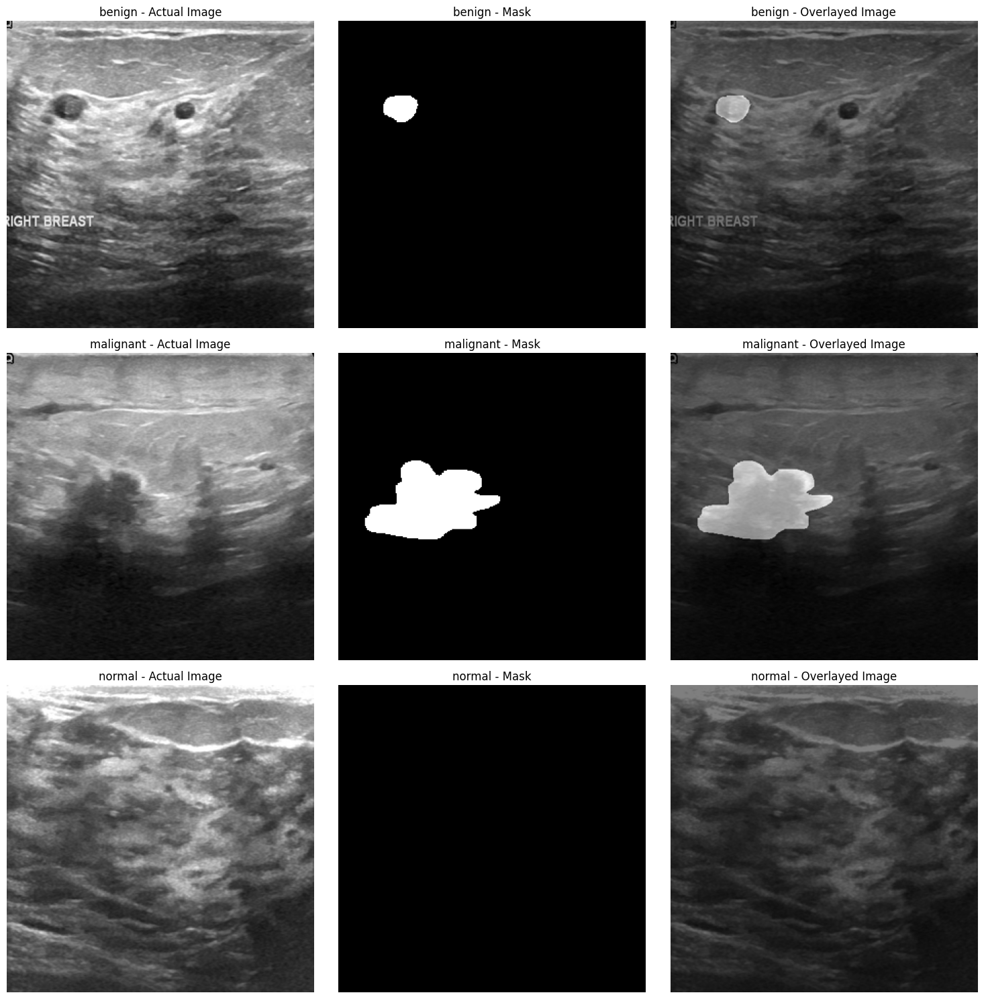

In [28]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Define paths for input and overlayed images
input_dir = './Cleaned_Dataset'
overlayed_dir = './working/OverlayedImages_cleaned'
labels = ['benign', 'malignant', 'normal']

# Create a figure to display the images
fig, axs = plt.subplots(len(labels), 3, figsize=(15, 5 * len(labels)))

# Loop through each label and display the first 4 images
for i, label in enumerate(labels):
    label_dir = os.path.join(overlayed_dir, label)
    images = [image for image in os.listdir(label_dir) if image.endswith('.png')]
    images.sort(key=lambda x: int(x.split('(')[1].split(')')[0]))  # Sort by the number in parentheses

    for j, image_filename in enumerate(images[:4]):  # Display first 4 images
        display_images(label, image_filename, fig, axs, i)

plt.tight_layout()
plt.show()


In [31]:
# Set paths for the cleaned dataset
cleaned_data_dir = './Cleaned_Dataset'
output_dirs = {
    'train': './working/OverlayedImages_cleaned/train',
    'validation': './working/OverlayedImages_cleaned/validation',
    'test': './working/OverlayedImages_cleaned/test'
}

# Define the labels
labels = ['benign', 'malignant', 'normal']

# Function to gather image file paths and their corresponding labels
def gather_image_paths(data_dir, labels):
    file_paths = []
    labels_list = []
    
    for label in labels:
        label_dir = os.path.join(data_dir, label)
        if os.path.isdir(label_dir):
            for image_file in os.listdir(label_dir):
                if image_file.endswith('.png') and not any(mask in image_file for mask in ['_mask.png', '_mask_1.png', '_mask_2.png']):
                    file_paths.append(os.path.join(label_dir, image_file))
                    labels_list.append(label)
    
    return pd.DataFrame({'Image_Path': file_paths, 'Label': labels_list})

# Gather image paths and labels
data = gather_image_paths(cleaned_data_dir, labels)

# Split the dataset into train, validation, and test sets
train_data, test_data = train_test_split(data, test_size=0.15, random_state=42, stratify=data['Label'])
train_data, val_data = train_test_split(train_data, test_size=0.15, random_state=42, stratify=train_data['Label'])

# Function to create directories for the dataset
def create_dirs(base_dirs, labels):
    for base_dir in base_dirs.values():
        for label in labels:
            os.makedirs(os.path.join(base_dir, label), exist_ok=True)

# Create directories for the train, validation, and test sets
create_dirs(output_dirs, labels)

# Function to copy images to the corresponding directories
def copy_images(data_split, base_dir):
    for _, row in data_split.iterrows():
        image_path = row['Image_Path']
        label = row['Label']
        shutil.copy(image_path, os.path.join(base_dir, label))

# Copy images to the respective directories
for split, base_dir in output_dirs.items():
    data_split = {'train': train_data, 'validation': val_data, 'test': test_data}[split]
    copy_images(data_split, base_dir)

print("Images have been successfully organized and copied to the respective directories.")



Images have been successfully organized and copied to the respective directories.


In [34]:
# Create datasets for train, validation, and test
image_datasets = {
    x: ImageFolder(
        root=os.path.join('./working/OverlayedImages_cleaned', x),  # 使用已经划分的清理数据集路径
        transform=data_transforms[x]  # Apply corresponding transformations
    )
    for x in ['train', 'validation', 'test']
}

# Specify batch size for DataLoaders
batch_size = 8  # Adjust this based on your hardware and preferences

# Create DataLoaders for train, validation, and test
dataloaders_cleaned = {
    x: DataLoader(image_datasets[x], batch_size=batch_size, shuffle=True, num_workers=4)
    for x in ['train', 'validation', 'test']
}

# Calculate the dataset sizes
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'validation', 'test']}

# Get the class labels from the training set
class_names = image_datasets['train'].classes

# Print the dataset sizes and class labels
print("Dataset Sizes:", dataset_sizes)
print("Class Labels:", class_names)


Dataset Sizes: {'train': 438, 'validation': 78, 'test': 92}
Class Labels: ['benign', 'malignant', 'normal']


In [38]:
import torch
import torch.nn as nn
from torchvision import models
from torch.optim import lr_scheduler
import torch.optim as optim
from tqdm import tqdm  # 引入 tqdm 库

# 加载预训练的 ResNet-101 模型
resnet101_model = models.resnet101(weights='IMAGENET1K_V1')  # 加载 ImageNet 权重

# 解冻所有参数以进行微调
for param in resnet101_model.parameters():
    param.requires_grad = True

# 替换 ResNet 的最后一个全连接层
input_features = resnet101_model.fc.in_features
num_classes = len(class_names)  # 定义输出类别数，例如 ['benign', 'malignant', 'normal']
resnet101_model.fc = nn.Linear(input_features, num_classes)

# 将模型移动到 GPU 或 CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
Resnet_fineTuning = resnet101_model.to(device)

print("Modified ResNet-101 model ready for fine-tuning:")
print(Resnet_fineTuning)

# 定义优化器
optimizer = optim.Adam(Resnet_fineTuning.parameters(), lr=0.00005)

# 定义学习率调度器
Decay_Learning_Rate = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

# 定义损失函数
Loss_Function = nn.CrossEntropyLoss()

# 使用提前停止的训练函数，添加进度条
def train_with_early_stopping_progress(
    model, loss_fn, optimizer, scheduler, dataloaders, dataset_sizes, class_names,
    device, num_epochs=20, patience=2
):
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = float('inf')
    consecutive_epochs_without_improvement = 0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch + 1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'validation']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            # 使用 tqdm 包装 DataLoader
            progress_bar = tqdm(dataloaders[phase], desc=f'{phase.capitalize()} Progress', leave=True)

            for inputs, labels in progress_bar:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = loss_fn(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

                # 更新进度条的后缀显示
                progress_bar.set_postfix({
                    'Loss': f'{loss.item():.4f}',
                    'Accuracy': f'{torch.sum(preds == labels.data).item() / len(labels):.4f}'
                })

            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase.capitalize()} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            if phase == 'validation' and epoch_loss < best_loss:
                best_loss = epoch_loss
                best_model_wts = copy.deepcopy(model.state_dict())
                consecutive_epochs_without_improvement = 0
            elif phase == 'validation':
                consecutive_epochs_without_improvement += 1

        if consecutive_epochs_without_improvement >= patience:
            print(f"Early stopping triggered after {epoch + 1} epochs.")
            break

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best validation Loss: {best_loss:.4f}')

    model.load_state_dict(best_model_wts)
    return model

# 调用更新的训练函数
model_after_cleaning_fineTuning = train_with_early_stopping_progress(
    Resnet_fineTuning, Loss_Function, optimizer, Decay_Learning_Rate, 
    dataloaders_cleaned, dataset_sizes, class_names, device, num_epochs=20, patience=2
)

# 保存训练好的模型
torch.save(model_after_cleaning_fineTuning.state_dict(), "./working/OverlayedImages_cleaned/Resnet_fineTuning.pth")
print("ResNet-101 fine-tuned model saved to ./working/OverlayedImages_cleaned/Resnet_fineTuning.pth")


Modified ResNet-101 model ready for fine-tuning:
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0)

Train Progress: 100%|██████████| 55/55 [00:04<00:00, 11.37it/s, Loss=0.4013, Accuracy=1.0000]


Train Loss: 0.8398 Acc: 0.5753


Validation Progress: 100%|██████████| 10/10 [00:00<00:00, 12.33it/s, Loss=0.3526, Accuracy=0.8333]


Validation Loss: 0.7986 Acc: 0.6026
Epoch 2/20
----------


Train Progress: 100%|██████████| 55/55 [00:04<00:00, 11.40it/s, Loss=0.5260, Accuracy=0.6667]


Train Loss: 0.5417 Acc: 0.7740


Validation Progress: 100%|██████████| 10/10 [00:00<00:00, 12.65it/s, Loss=0.4234, Accuracy=0.6667]


Validation Loss: 0.6678 Acc: 0.7949
Epoch 3/20
----------


Train Progress: 100%|██████████| 55/55 [00:04<00:00, 11.37it/s, Loss=1.2589, Accuracy=0.5000]


Train Loss: 0.4692 Acc: 0.8288


Validation Progress: 100%|██████████| 10/10 [00:00<00:00, 12.32it/s, Loss=0.6146, Accuracy=0.6667]


Validation Loss: 0.5571 Acc: 0.7692
Epoch 4/20
----------


Train Progress: 100%|██████████| 55/55 [00:04<00:00, 13.42it/s, Loss=0.1715, Accuracy=1.0000]


Train Loss: 0.3263 Acc: 0.8881


Validation Progress: 100%|██████████| 10/10 [00:00<00:00, 12.32it/s, Loss=0.3867, Accuracy=0.8333]


Validation Loss: 0.6672 Acc: 0.7564
Epoch 5/20
----------


Train Progress: 100%|██████████| 55/55 [00:04<00:00, 11.40it/s, Loss=0.1572, Accuracy=1.0000]


Train Loss: 0.3027 Acc: 0.9132


Validation Progress: 100%|██████████| 10/10 [00:00<00:00, 12.55it/s, Loss=0.3882, Accuracy=0.6667]


Validation Loss: 0.5777 Acc: 0.7308
Early stopping triggered after 5 epochs.
Training complete in 0m 28s
Best validation Loss: 0.5571
ResNet-101 fine-tuned model saved to ./working/OverlayedImages_cleaned/Resnet_fineTuning.pth


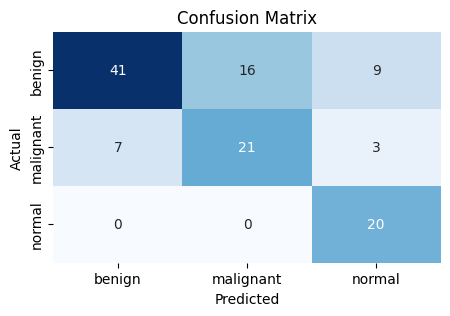

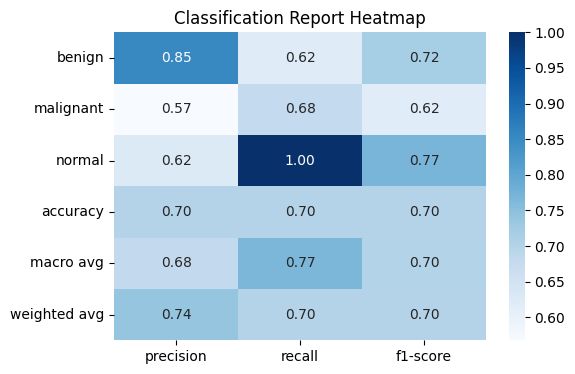

Simplified Classification Report:
             benign  malignant    normal  accuracy  macro avg  weighted avg
precision  0.854167   0.567568  0.625000  0.700855   0.682245      0.739056
recall     0.621212   0.677419  1.000000  0.700855   0.766210      0.700855
f1-score   0.719298   0.617647  0.769231  0.700855   0.702059      0.700900


In [57]:
# %%
# Define label names
label_names = [str(class_names[i]) for i in range(len(class_names))]

# Calculate classification report and confusion matrix on unseen test data
y_true = []
y_pred = []

model_after_cleaning_fineTuning.eval()  # Set model to evaluation mode

with torch.no_grad():
    for inputs, labels in dataloaders['test']:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model_after_cleaning_fineTuning(inputs)
        _, preds = torch.max(outputs, 1)

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# Generate classification report
classification_rep = classification_report(y_true, y_pred, target_names=label_names, output_dict=True)

# Generate confusion matrix
confusion_mat = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix with label names
plt.figure(figsize=(5, 3))
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=label_names, yticklabels=label_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Convert the classification report to a heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(pd.DataFrame(classification_rep).iloc[:-1, :].T, annot=True, cmap='Blues', fmt='.2f')  # Simplify classification report
plt.title('Classification Report Heatmap')
plt.show()

# Print the simplified classification report
print("Simplified Classification Report:")
print(pd.DataFrame(classification_rep).iloc[:-1, :])


可见，在删除错误数据后。验证集的准确率反倒从97%下降到80%以下，损失也只能达到0.5571，f1-score从1下降到0.7，模型表现相比之前更差。可能原因如下：

（1）数据清洗后，样本数量减少，可能导致模型无法获得足够的数据来学习特征，数据量的不足会限制模型的训练效果，从而降低其预测能力。  

（2）清洗前，由于某些类别占比较大，模型可能通过偏向这些类别而获得较高的准确率。而清洗后，从统计结果可以看出，benign类别被删除的图片显著多于其他两类，这使得类别分布更均衡。模型需要更准确地学习每个类别的特征，因此训练难度增加。  

（3）去除重复图片和一些错误图片的过程，同时也清除了部分噪声和异常值。这意味着模型失去了对这些信息的拟合能力，从而可能难以达到之前的拟合效果。  

（4）清洗去除了标注错误或异常数据后，验证集中保留的样本可能更标准，更符合实际分布。模型性能的下降并不一定意味着模型变差，而可能是清洗数据后暴露出模型原有的不足。清洗后的数据更加干净且更难预测，要求模型具有更高的表达能力以捕捉新的特征。如果现有模型复杂度不足或优化不够，则可能无法很好地适应清洗后的数据分布。

再次进行Task2

In [60]:
# %%
input_dir = "./Cleaned_Dataset"  
classes = sorted(os.listdir(input_dir))
classes


['benign', 'malignant', 'normal']

In [61]:
# %%
single_mask_paths = sorted([sorted(glob(os.path.join(input_dir, name, "*_mask.png"))) for name in classes])
double_mask_paths = sorted([sorted(glob(os.path.join(input_dir, name, "*_mask_1.png"))) for name in classes])


In [62]:
# %%
image_paths = []
mask_paths = []
for class_path in single_mask_paths:
    for path in class_path:
        img_path = path.replace('_mask','')
        image_paths.append(img_path)
        mask_paths.append(path)


In [63]:
images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)

In [69]:
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
import torch.nn.functional as F
import torch
from torch.utils.data import Dataset
import os
from torchvision import transforms

# Define a function to calculate accuracy and IoU
def calculate_accuracy_and_iou(preds, masks, threshold=0.5):
    preds = (preds > threshold).float()
    
    correct = (preds == masks).sum()
    total = preds.numel()
    
    accuracy = (correct / total).item()

    intersection = (preds * masks).sum()
    union = preds.sum() + masks.sum() - intersection
    iou = (intersection + 1e-6) / (union + 1e-6)  # Avoid division by zero

    return accuracy, iou

class ImageMaskDataset(Dataset):
    def __init__(self, image_paths, mask_paths, size):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.size = size
        
    def __len__(self):
        return len(self.image_paths)
        
    def __getitem__(self, idx):
        image = load_image(self.image_paths[idx], self.size, is_mask=False)
        mask = load_image(self.mask_paths[idx], self.size, is_mask=True)
        return image, mask

# Model setup and training
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Split the dataset into training and validation
dataset = ImageMaskDataset(image_paths, mask_paths, SIZE)

train_size = int(0.8 * len(dataset))  # 80% for training
val_size = len(dataset) - train_size  # Remaining 20% for validation
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

# Prepare dataloaders
train_dataloader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=4)
val_dataloader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=4)

# Model, optimizer, and loss function
model = AttentionUNet(in_channels=3, out_channels=1)
model = model.to(device)  # Move model to GPU/CPU
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.BCELoss()

train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

# Training loop
num_epochs = 20
for epoch in range(num_epochs):
    # Training phase
    model.train()
    running_loss = 0.0
    total_accuracy = 0.0
    
    for images, masks in train_dataloader:
        images = images.to(device)
        masks = masks.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        
        # Compute loss
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Compute accuracy
        accuracy, _ = calculate_accuracy_and_iou(outputs, masks)
        total_accuracy += accuracy
        
    epoch_loss = running_loss / len(train_dataloader)
    epoch_accuracy = total_accuracy / len(train_dataloader)
    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_accuracy)

    # Validation phase
    model.eval()
    val_loss = 0.0
    val_accuracy = 0.0
    
    with torch.no_grad():
        for images, masks in val_dataloader:
            images = images.to(device)
            masks = masks.to(device)
            
            outputs = model(images)
            
            # Compute loss
            loss = criterion(outputs, masks)
            val_loss += loss.item()
            
            # Compute accuracy and IoU
            accuracy, iou = calculate_accuracy_and_iou(outputs, masks)
            val_accuracy += accuracy

    val_loss /= len(val_dataloader)
    val_accuracy /= len(val_dataloader)

    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)

    # Print training and validation results
    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"Train Loss: {epoch_loss:.4f}, Train Accuracy: {epoch_accuracy:.4f}")
    print(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}")
    
    # Save checkpoint
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_loss': epoch_loss,
        'val_loss': val_loss,
    }, f'checkpoint_epoch_{epoch}.pt')


Epoch 1/20
Train Loss: 0.3540, Train Accuracy: 0.9267
Validation Loss: 0.2571, Validation Accuracy: 0.9331
Epoch 2/20
Train Loss: 0.2614, Train Accuracy: 0.9264
Validation Loss: 0.2432, Validation Accuracy: 0.9331
Epoch 3/20
Train Loss: 0.2415, Train Accuracy: 0.9265
Validation Loss: 0.2563, Validation Accuracy: 0.9331
Epoch 4/20
Train Loss: 0.2151, Train Accuracy: 0.9268
Validation Loss: 0.1943, Validation Accuracy: 0.9331
Epoch 5/20
Train Loss: 0.2007, Train Accuracy: 0.9266
Validation Loss: 0.1686, Validation Accuracy: 0.9331
Epoch 6/20
Train Loss: 0.1885, Train Accuracy: 0.9269
Validation Loss: 0.1856, Validation Accuracy: 0.9331
Epoch 7/20
Train Loss: 0.1763, Train Accuracy: 0.9266
Validation Loss: 0.1801, Validation Accuracy: 0.9331
Epoch 8/20
Train Loss: 0.1731, Train Accuracy: 0.9268
Validation Loss: 0.1970, Validation Accuracy: 0.9331
Epoch 9/20
Train Loss: 0.1701, Train Accuracy: 0.9264
Validation Loss: 0.1756, Validation Accuracy: 0.9331
Epoch 10/20
Train Loss: 0.1606, Train

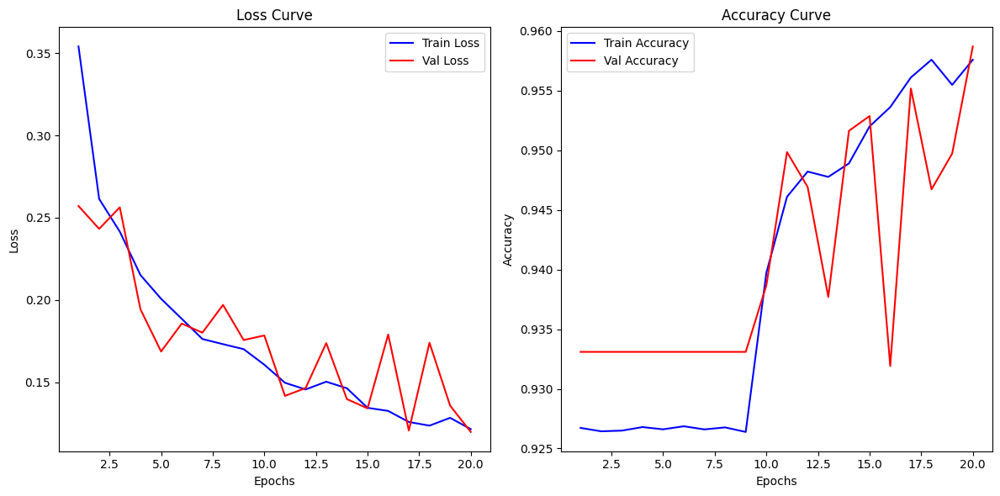

In [70]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot loss curve (train vs validation)
plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs + 1), train_losses, label="Train Loss", color='blue')
plt.plot(range(1, num_epochs + 1), val_losses, label="Val Loss", color='red')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss Curve")
plt.legend()

# Plot accuracy curve (train vs validation)
plt.subplot(1, 2, 2)
plt.plot(range(1, num_epochs + 1), train_accuracies, label="Train Accuracy", color='blue')
plt.plot(range(1, num_epochs + 1), val_accuracies, label="Val Accuracy", color='red')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy Curve")
plt.legend()

plt.tight_layout()
plt.show()



与清理前对比，清理后的数据在Attention-Unet分割任务中，验证集准确率从95%提升至约96%，相差不大，但是其表现更加不稳定，模型的泛化能力下降，可能是由于数据量不足导致。

#### **总结：**

在任务一中，数据清理后模型表现整体下降，体现在准确率和 F1 分数的降低，以及更多的误分类；在任务二中，数据清理后模型存在效果的提升与稳定性、泛化能力的下降。其原因可能包括：

* 清理导致数据量减少，样本不足导致模型预测能力下降；

* 类别分布更分散，模型学习难度增加；

* 去除噪声和异常值后，模型可利用信息减少；

* 验证数据中重复数据消失，模型判断难度上升；